# Finance Analysis with Pymc

**Table of Contents**
- [CHOOSING THE DATA](#CHOOSING-THE-DATA)
- [CLASSIC POINT OF VIEW](#CLASSIC-POINT-OF-VIEW)

# CHOOSING THE DATA

In [ ]:
import pymc as pm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yfinance as yf
import arviz as az
import statsmodels.api as sm

In [ ]:
print(f"Running on PyMC v{pm.__version__}")

sektor_mapping = {
    'GOOG': 'THECHNOLOGY',
    'META': 'THECHNOLOGY',
    'CAT': 'PRODUCERS',
    'PEP': 'CONSUMER',
    'KO': 'CONSUMER'
}
TICKERS = list(sektor_mapping.keys())
sektors = sorted(list(set(sektor_mapping.values())))
sektor_names = ['THECHNOLOGY', 'CONSUMER', 'PRODUCERS']

N_SECTORS = len(sektors)
sektor_lookup = {sektor: i for i, sektor in enumerate(sektors)}
sektor_idx = np.array([sektor_lookup[sektor_mapping[ticker]] for ticker in TICKERS])



# Load stock prices
TICKERS = ['GOOG', 'META','CAT','KO', 'PEP']
START_DATE = '2024-01-01'
END_DATE = '2025-07-09'
N_STOCKS = len(TICKERS)

try:
    prices = yf.download(TICKERS, start=START_DATE, end=END_DATE)["Close"]
    prices = prices[TICKERS]
    print("Example for the first 5 rows of stock prices:")
    print(prices.head())
    returns = prices.pct_change()
    print("Example for the first 5 rows of stock returns:")
    print(returns.head()) 
    print(f"Start date in data: {returns.index.min()}")
    print(f"End date in data:   {returns.index.max()}")
    
    log_returns = np.log(returns + 1)
    scaled_returns = log_returns * 100

    # Load the stock data successfully!
    y_data = scaled_returns.dropna().values
    print("Stock data loaded successfully!")

    # Print the dimensions of the data: number of trading days and number of stocks.
    print(f"Data dimensions: {y_data.shape[0]} trading days, {y_data.shape[1]} stocks.")

    # Handle exceptions during data loading.
except Exception as e:
    print(f"Error loading data: {e}")
    exit()

num_days = y_data.shape[0]

Running on PyMC v5.26.1


/var/folders/jt/w85x3rfd3cq6h1wyk8v8r3sm0000gn/T/ipykernel_22614/3627393117.py:36: FutureWarning: YF.download() has changed argument auto_adjust default to True
  prices = yf.download(TICKERS, start=START_DATE, end=END_DATE)["Close"]
[*********************100%***********************]  5 of 5 completed

Example for the first 5 rows of stock prices:
Ticker            GOOG        META         CAT         KO         PEP
Date                                                                 
2024-01-02  138.521072  344.168304  283.803619  56.383648  161.106674
2024-01-03  139.315125  342.359436  275.649536  56.515602  161.143921
2024-01-04  137.012375  344.993195  277.394806  56.327087  159.764984
2024-01-05  136.367203  349.793671  280.138672  56.242260  157.407669
2024-01-08  139.483856  356.462555  283.357635  56.656982  157.566071
Example for the first 5 rows of stock returns:
Ticker          GOOG      META       CAT        KO       PEP
Date                                                        
2024-01-02       NaN       NaN       NaN       NaN       NaN
2024-01-03  0.005732 -0.005256 -0.028731  0.002340  0.000231
2024-01-04 -0.016529  0.007693  0.006331 -0.003336 -0.008557
2024-01-05 -0.004709  0.013915  0.009892 -0.001506 -0.014755
2024-01-08  0.022855  0.019065  0.011491  0.007374 

In [2]:
# (NaNs)
print(f"Are there any NaN values? {np.isnan(y_data).any()}")


Are there any NaN values? False


# CLASSIC POINT OF VIEW

In [3]:
print("\nStandard deviations of each stock:")
print(pd.Series(y_data.std(axis=0)))
print("\nMean standard deviation of all stocks:")
print(y_data.std(axis=0).mean())
print("\nMean price of each stock:")
print(pd.Series(prices.mean(axis=0)))
print("\nMean price of all stocks:")
print(prices.mean(axis=0).mean())


print("\nCorrelation matrix:")
print(pd.DataFrame(y_data).corr())


Standard deviations of each stock:
0    1.912544
1    2.388718
2    1.799176
3    0.969254
4    1.191889
dtype: float64

Mean standard deviation of all stocks:
1.652315982844372

Mean price of each stock:
Ticker
GOOG    167.662225
META    549.879426
CAT     345.278937
KO       64.212971
PEP     155.131456
dtype: float64

Mean price of all stocks:
256.4330029973254

Correlation matrix:
          0         1         2         3         4
0  1.000000  0.493802  0.369589 -0.056434 -0.068587
1  0.493802  1.000000  0.436434 -0.057429 -0.032764
2  0.369589  0.436434  1.000000 -0.028224  0.089069
3 -0.056434 -0.057429 -0.028224  1.000000  0.612234
4 -0.068587 -0.032764  0.089069  0.612234  1.000000


## CLASSICAL REGRESSION ON THE MEAN PRICE OF ALL STOCKS

In [4]:
prices_clean = prices.dropna()
T = len(prices_clean)
time = np.arange(T)


avg_price = prices_clean.mean(axis=1).values
X_avg = sm.add_constant(time)
model_avg = sm.OLS(avg_price, X_avg).fit()


pred_avg = model_avg.get_prediction(X_avg).summary_frame(alpha=0.05)
mean_avg = pred_avg['mean']
lower_avg = pred_avg['mean_ci_lower']
upper_avg = pred_avg['mean_ci_upper']



THE GRAPH

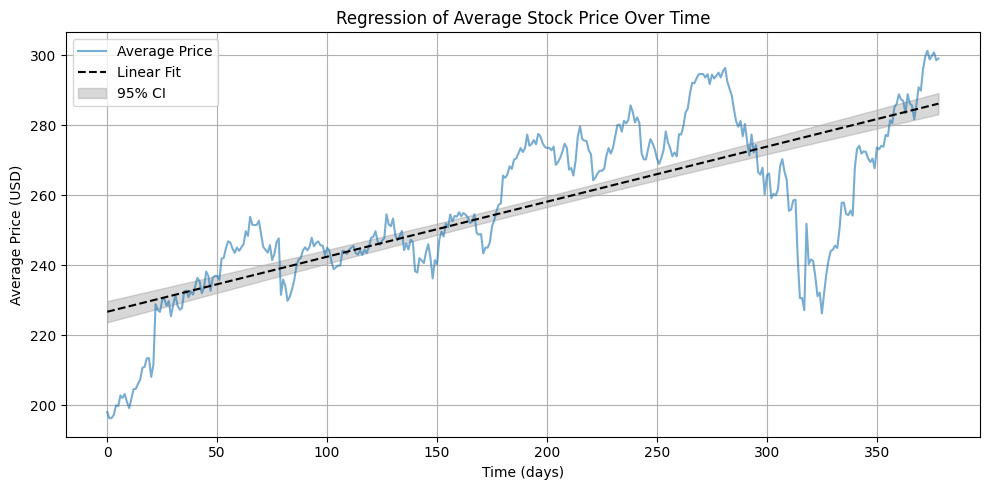

🔹 Regression on average price over time:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.568
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     495.9
Date:                Tue, 15 Jul 2025   Prob (F-statistic):           1.01e-70
Time:                        15:33:14   Log-Likelihood:                -1564.3
No. Observations:                 379   AIC:                             3133.
Df Residuals:                     377   BIC:                             3140.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      

In [5]:
plt.figure(figsize=(10, 5))
plt.plot(time, avg_price, label='Average Price', alpha=0.6)
plt.plot(time, mean_avg, label='Linear Fit', color='black', linestyle='--')
plt.fill_between(time, lower_avg, upper_avg, color='gray', alpha=0.3, label='95% CI')
plt.title("Regression of Average Stock Price Over Time")
plt.xlabel("Time (days)")
plt.ylabel("Average Price (USD)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print("🔹 Regression on average price over time:")
print(model_avg.summary())

The regression shows that ~57% of the variation in average price (y) is explained by time (x1), indicating a moderate fit (R² = 0.568). The slope is 0.1573 (p < 0.001), meaning the average price increases by ~0.157 units per time unit, and this effect is statistically significant.  

However, residual diagnostics reveal issues:  
- **Durbin-Watson = 0.058** → strong positive autocorrelation (likely time series effect)  
- **Jarque-Bera p < 0.0001** → residuals are not normally distributed  
- **Skew = -0.98**, **Kurtosis = 4.06** → asymmetric and fat-tailed residuals  

These violations suggest OLS assumptions are not fully met. A time series model (e.g., ARIMA) or robust standard errors (e.g., Newey-West) might be more appropriate.


## STOCK REGRESSION

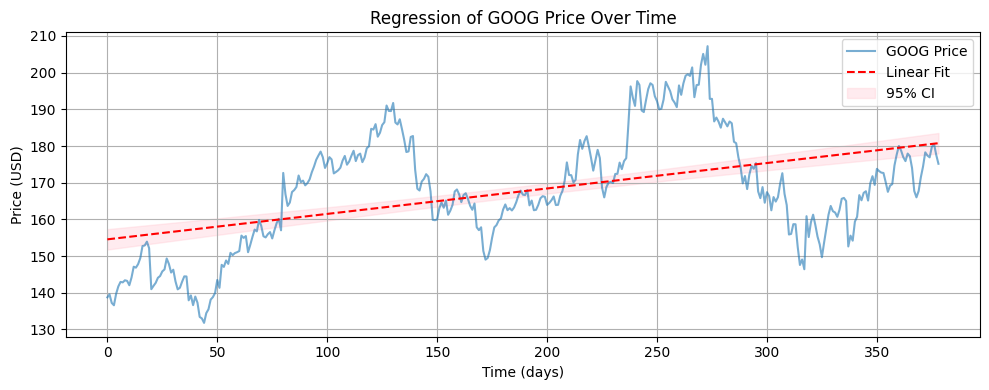

🔹 Regression for GOOG:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     114.5
Date:                Tue, 15 Jul 2025   Prob (F-statistic):           1.64e-23
Time:                        15:33:15   Log-Likelihood:                -1531.7
No. Observations:                 379   AIC:                             3067.
Df Residuals:                     377   BIC:                             3075.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        154.5530      1.

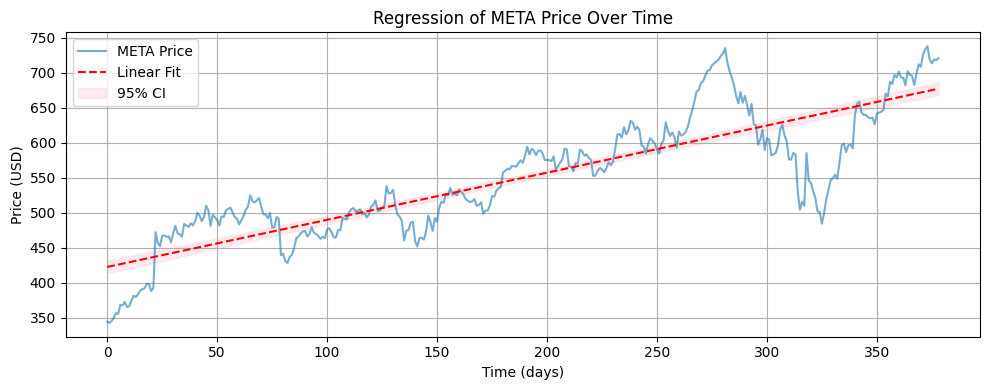

🔹 Regression for META:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.727
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     1005.
Date:                Tue, 15 Jul 2025   Prob (F-statistic):          2.12e-108
Time:                        15:33:15   Log-Likelihood:                -1981.7
No. Observations:                 379   AIC:                             3967.
Df Residuals:                     377   BIC:                             3975.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        422.5356      4.

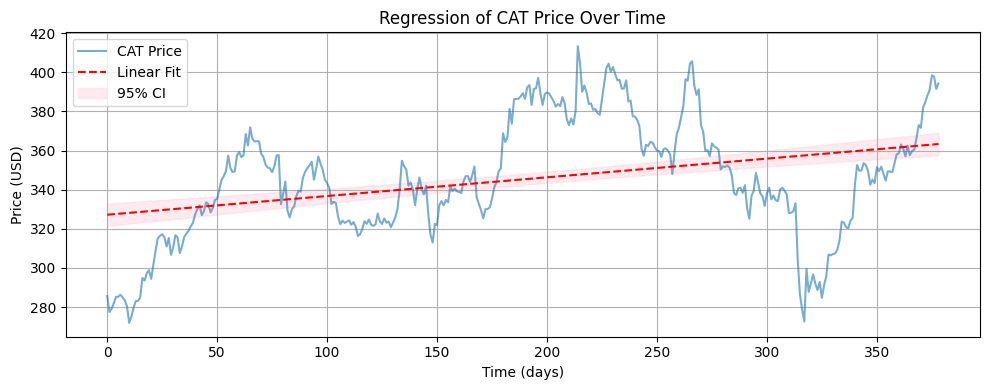

🔹 Regression for CAT:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.117
Method:                 Least Squares   F-statistic:                     51.21
Date:                Tue, 15 Jul 2025   Prob (F-statistic):           4.36e-12
Time:                        15:33:15   Log-Likelihood:                -1805.8
No. Observations:                 379   AIC:                             3616.
Df Residuals:                     377   BIC:                             3623.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        327.2108      2.9

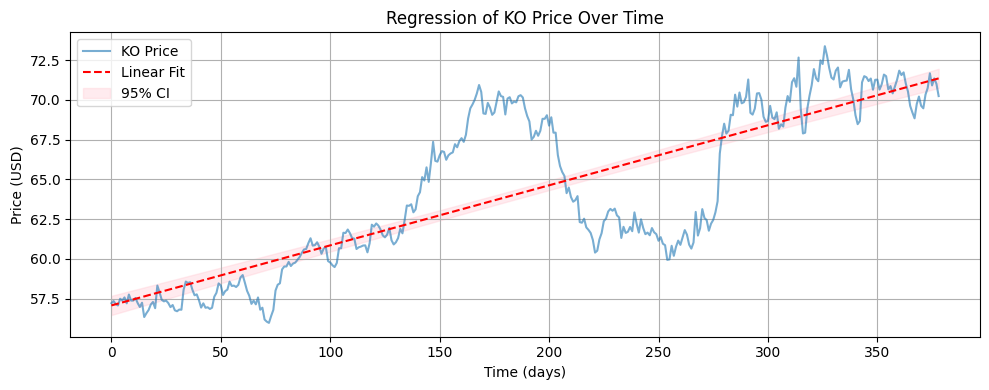

🔹 Regression for KO:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.657
Model:                            OLS   Adj. R-squared:                  0.656
Method:                 Least Squares   F-statistic:                     722.0
Date:                Tue, 15 Jul 2025   Prob (F-statistic):           1.31e-89
Time:                        15:33:15   Log-Likelihood:                -952.38
No. Observations:                 379   AIC:                             1909.
Df Residuals:                     377   BIC:                             1917.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         57.0747      0.30

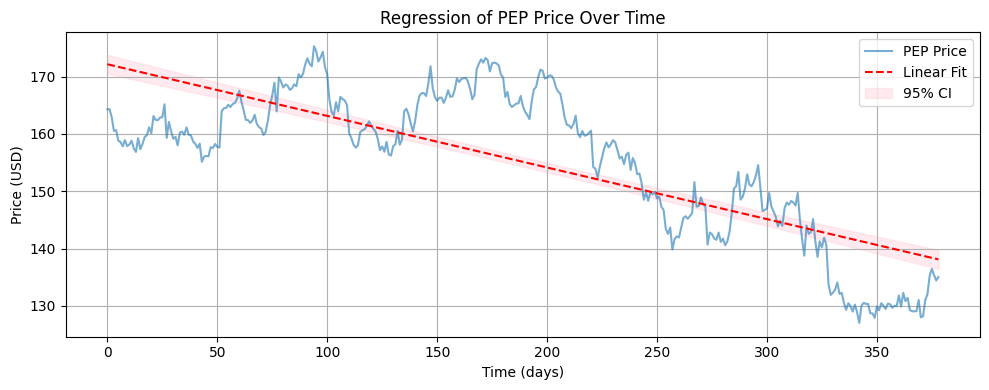

🔹 Regression for PEP:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.592
Method:                 Least Squares   F-statistic:                     548.8
Date:                Tue, 15 Jul 2025   Prob (F-statistic):           1.52e-75
Time:                        15:33:15   Log-Likelihood:                -1333.4
No. Observations:                 379   AIC:                             2671.
Df Residuals:                     377   BIC:                             2679.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        172.1395      0.8

In [6]:
for ticker in TICKERS:
    series = prices_clean[ticker].values
    X = sm.add_constant(time)
    model = sm.OLS(series, X).fit()

    pred = model.get_prediction(X).summary_frame(alpha=0.05)
    mean = pred['mean']
    lower = pred['mean_ci_lower']
    upper = pred['mean_ci_upper']

    plt.figure(figsize=(10, 4))
    plt.plot(time, series, label=f"{ticker} Price", alpha=0.6)
    plt.plot(time, mean, label="Linear Fit", color='red', linestyle='--')
    plt.fill_between(time, lower, upper, color='pink', alpha=0.3, label='95% CI')
    plt.title(f"Regression of {ticker} Price Over Time")
    plt.xlabel("Time (days)")
    plt.ylabel("Price (USD)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    print(f"🔹 Regression for {ticker}:")
    print(model.summary())

# BAYESIAN MODEL 

In [7]:
coords = {
   "stock": TICKERS,
   "sector": sektor_names,
   "obs_id": np.arange(y_data.shape[0]) 
}


## SEKTOR MODEL

(378, 5)
Shape.0


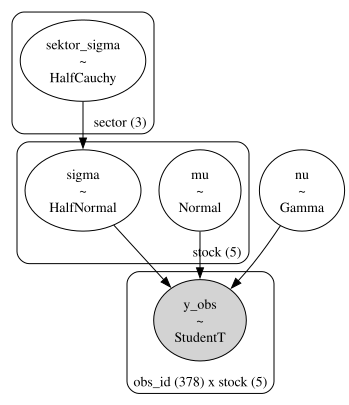

In [8]:
with pm.Model(coords=coords) as model_sektors:  #(coords=coords)


    # SEKTOR PRIORE FOR VOLATILITY
    sektor_sigma = pm.HalfCauchy("sektor_sigma", beta=2, dims="sector")
        
    # STOCK LEVEL PRIORS
    mu = pm.Normal("mu", mu=0, sigma=1, dims = "stock") 
        
    # THE OTHER PARAMETERS 
    sigma = pm.HalfNormal("sigma", sigma=sektor_sigma[sektor_idx], dims="stock")
    nu = pm.Gamma("nu", alpha=1, beta=1)

    # Likelihood
    y_sek_obs = pm.StudentT(
        "y_obs",
        nu=nu,
        mu=mu,
        
        sigma=sigma,
        observed=y_data,
        dims=("obs_id", "stock")
    )

print(y_data.shape)
print(y_sek_obs.shape)
graph = pm.model_to_graphviz(model_sektors)
display(graph) 

https://en.wikipedia.org/wiki/Gamma_distribution


https://en.wikipedia.org/wiki/Student%27s_t-distribution

https://en.wikipedia.org/wiki/Cauchy_distribution

The model uses a Student’s T-distribution to account for fat tails in daily stock returns, making it more robust to outliers. The `nu` parameter controls tail heaviness and is assigned a Gamma prior (`Gamma(0.5, 1)`) to allow flexibility between normal-like and heavy-tailed behavior.

---

The prior on the mean return (`mu`) is `Normal(0, 0.5)`, reflecting the belief that daily returns are centered near 
zero with some allowance for variation.

---
Volatility is modeled hierarchically: each stock’s volatility (`sigma`) is drawn from a `HalfNormal` centered on its sector-level volatility (`sektor_sigma`). The sector-level volatility has a `HalfCauchy(beta=2)` prior, allowing for extreme values without constraining the model.

---

This structure encourages **shrinkage**: noisy or limited data for individual stocks are "pulled" toward the more stable sector-level estimates, improving generalization and preventing overfitting.


In [9]:
with model_sektors:
    idata = pm.sample(
        1000,
        tune=1000,          
        chains=2,
        idata_kwargs={"log_likelihood": True}          
    )


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sektor_sigma, mu, sigma, nu]


Output()

Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 1 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [10]:
idata

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

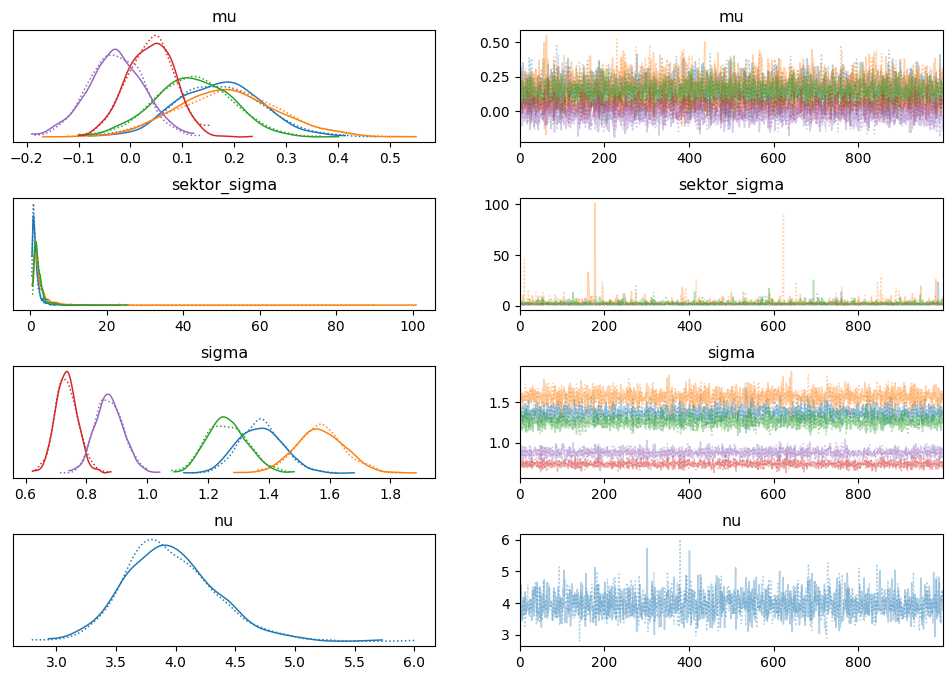

In [11]:
import matplotlib.pyplot as plt
az.plot_trace(idata, figsize=(12, 8))
plt.subplots_adjust(hspace = 0.5)
plt.show()

https://chi-feng.github.io/mcmc-demo/app.html?algorithm=RandomWalkMH&target=banana

In [12]:
az.summary(idata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu[GOOG],0.170,0.084,0.019,0.334,0.001,0.002,3577.0,1519.0,1.01
mu[META],0.187,0.099,0.006,0.380,0.002,0.003,4313.0,1335.0,1.00
mu[CAT],0.120,0.075,-0.025,0.255,0.001,0.002,4038.0,1503.0,1.00
mu[KO],0.039,0.045,-0.046,0.123,0.001,0.001,3061.0,1558.0,1.00
mu[PEP],-0.029,0.053,-0.136,0.069,0.001,0.001,4086.0,1554.0,1.00
sektor_sigma[THECHNOLOGY],1.406,1.152,0.366,3.039,0.029,0.130,3012.0,1452.0,1.00
sektor_sigma[CONSUMER],2.692,4.210,0.386,6.637,0.115,0.771,2796.0,1139.0,1.00
sektor_sigma[PRODUCERS],2.213,1.663,0.573,4.792,0.042,0.121,3409.0,1213.0,1.00
sigma[GOOG],1.373,0.072,1.240,1.506,0.001,0.002,2748.0,1545.0,1.00
sigma[META],1.569,0.080,1.427,1.731,0.002,0.002,2813.0,1584.0,1.00


## SIMPLE MODEL

(378, 5)
Shape.0


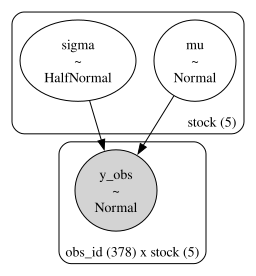

In [13]:
import pymc as pm

with pm.Model(coords=coords) as model_simple:

    mu = pm.Normal("mu", mu=0, sigma=1, dims="stock")    
    
    sigma = pm.HalfNormal("sigma", sigma=1, dims="stock")

    # Likelihood
    y_obs = pm.Normal(
        "y_obs",
        mu=mu,
        
        sigma=sigma,
        observed=y_data,
        dims=("obs_id", "stock")
    )

print(y_data.shape)
print(y_obs.shape)
graph = pm.model_to_graphviz(model_simple)

display(graph) 


In [14]:
with model_simple:
    idata_simple = pm.sample(
        1000,
        tune=2000,          
        chains=2,
        idata_kwargs={"log_likelihood": True}           
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [mu, sigma]


Output()

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/pymc/step_methods/hmc/quadpotential.py:316: RuntimeWarning: overflow encountered in dot
  return 0.5 * np.dot(x, v_out)


Sampling 2 chains for 2_000 tune and 1_000 draw iterations (4_000 + 2_000 draws total) took 1 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [15]:
idata_simple

Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data

In [16]:
az.summary(idata_simple)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu[GOOG],0.060,0.097,-0.122,0.236,0.002,0.002,2343.0,1631.0,1.00
mu[META],0.191,0.124,-0.036,0.425,0.003,0.003,2421.0,1249.0,1.00
mu[CAT],0.084,0.093,-0.083,0.267,0.002,0.002,2503.0,1397.0,1.00
mu[KO],0.056,0.050,-0.036,0.154,0.001,0.001,2820.0,1394.0,1.00
mu[PEP],-0.050,0.059,-0.150,0.073,0.001,0.001,2866.0,1808.0,1.00
sigma[GOOG],1.911,0.067,1.792,2.042,0.001,0.001,2379.0,1600.0,1.00
sigma[META],2.382,0.086,2.234,2.559,0.002,0.002,2745.0,1523.0,1.00
sigma[CAT],1.797,0.065,1.670,1.912,0.001,0.001,2802.0,1543.0,1.01
sigma[KO],0.972,0.037,0.909,1.046,0.001,0.001,3134.0,1336.0,1.00
sigma[PEP],1.196,0.044,1.115,1.276,0.001,0.001,2637.0,1634.0,1.00


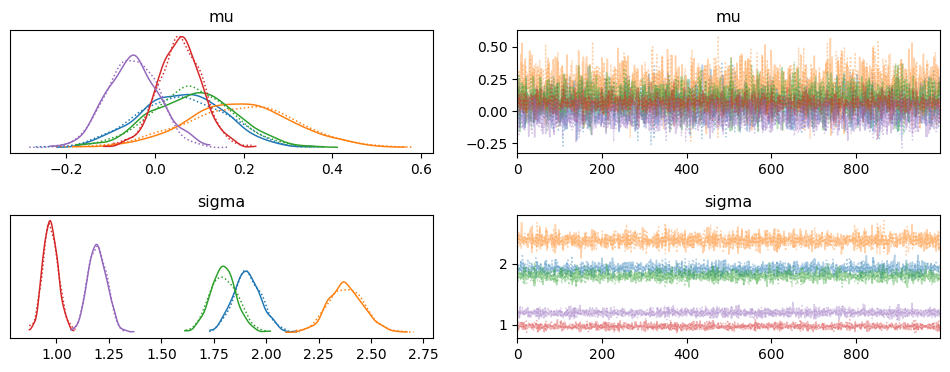

In [17]:
import matplotlib.pyplot as plt
az.plot_trace(idata_simple, figsize=(12, 4))
plt.subplots_adjust(hspace = 0.5)
plt.show()

## MODEL COMP

In [18]:
cmp_df = az.compare({"sektor": idata, "simple": idata_simple},ic="waic")
cmp_df

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/stats/stats.py:1667: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


,rank,elpd_waic,p_waic,elpd_diff,weight,se,dse,warning,scale
sektor,0,-3399.916451,10.977712,0.000000,0.97543,44.642803,0.000000,False,log
simple,1,-3549.558296,23.165428,149.641845,0.02457,62.992678,33.906867,True,log


<Axes: title={'center': 'Model comparison\nhigher is better'}, xlabel='elpd_waic (log)', ylabel='ranked models'>

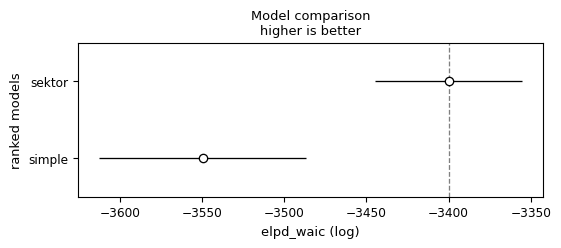

In [19]:
az.plot_compare(cmp_df)

# BAYESIAN INFERENCE

### HDI - high densety interval

array([[<Axes: title={'center': 'sigma\nGOOG'}>,
        <Axes: title={'center': 'sigma\nMETA'}>,
        <Axes: title={'center': 'sigma\nCAT'}>],
       [<Axes: title={'center': 'sigma\nKO'}>,
        <Axes: title={'center': 'sigma\nPEP'}>, <Axes: >]], dtype=object)

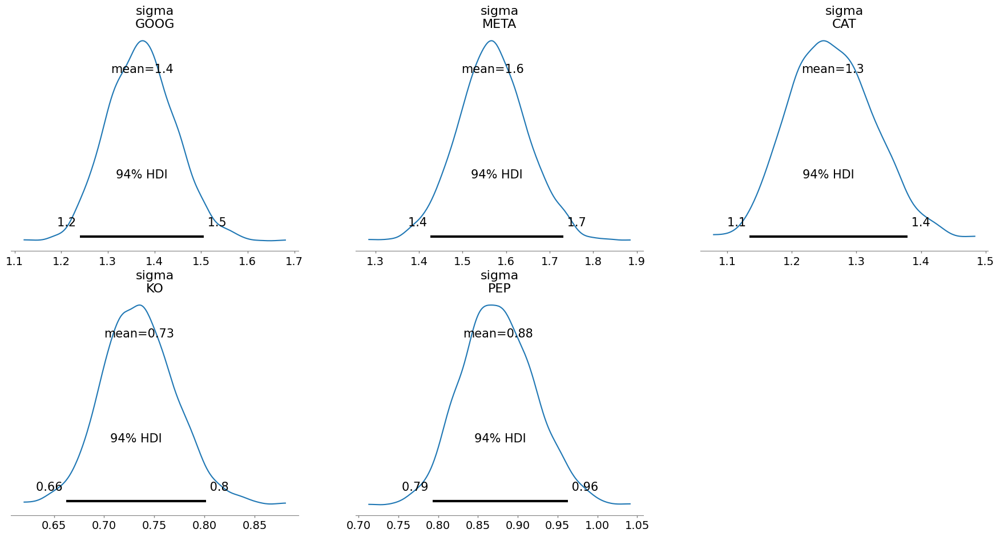

In [20]:
az.plot_posterior(idata.posterior["sigma"])

array([[<Axes: title={'center': 'mu\nGOOG'}>,
        <Axes: title={'center': 'mu\nMETA'}>,
        <Axes: title={'center': 'mu\nCAT'}>],
       [<Axes: title={'center': 'mu\nKO'}>,
        <Axes: title={'center': 'mu\nPEP'}>, <Axes: >]], dtype=object)

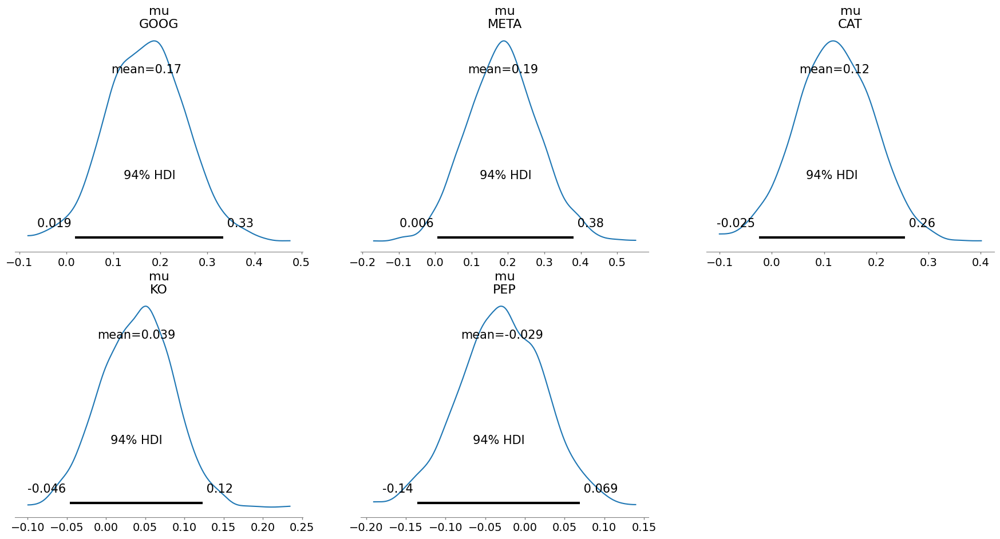

In [21]:
az.plot_posterior(idata.posterior["mu"])

## Hypotheses testing: Bayes factor

$$
\text{BF}_{01} = \frac{p_{\text{prior}}(\mu = 0)}{p_{\text{posterior}}(\mu = 0)}
$$


$$
\text{BF}_{10} = \frac{p_{\text{posterior}}(\mu = 0)}{p_{\text{prior}}(\mu = 0)} = \frac{1}{\text{BF}_{01}}
$$


### NORMAL

arviz - WARNING - The reference value is outside of the posterior. This translate into infinite support for H1, which is most likely an overstatement.
/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in lege

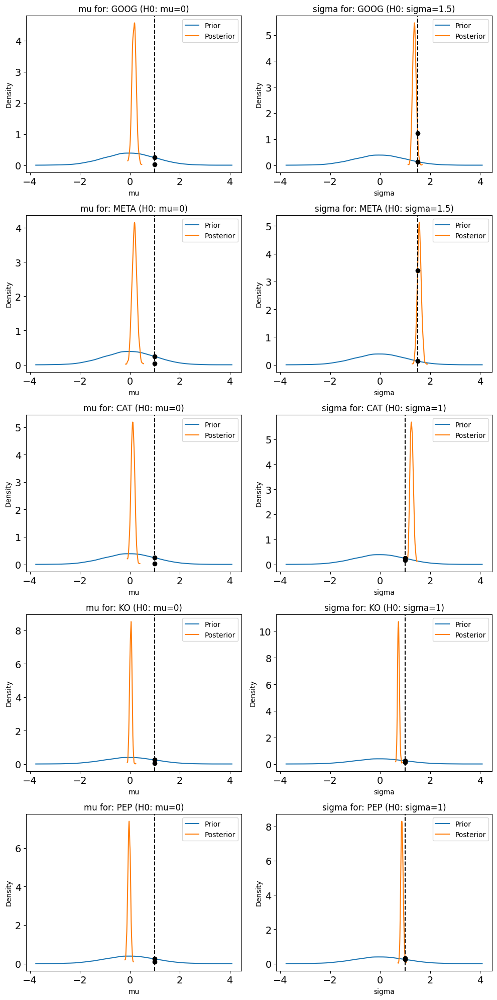

In [22]:
import xarray as xr
# define the sigma prior values for the null hypothesis (H0) for each stock
stock_h0 = {'GOOG': 1.5, 'META': 1.5, 'CAT': 1, 'KO': 1, 'PEP': 1}

# generate prior samples for the Bayes Factor plots
prior_samples = np.random.normal(0, 1, 10_000)
stock_names = idata.posterior["sigma"].coords["stock"].values
num_stocks = len(stock_names)

# create a grid of subplots: rows for each stock, 2 columns (one for mu, one for sigma)
fig, axes = plt.subplots(
    nrows=num_stocks,
    ncols=2,
    figsize=(10, num_stocks * 4),
    squeeze=False
)

# loop over each stock (each row in the plot)
for i, stock in enumerate(stock_names):

    
    ax_mu = axes[i, 0]
    mu_samples = idata.posterior['mu'].sel(stock=stock)
    mu_idata = az.InferenceData(posterior=xr.Dataset({'mu': mu_samples}))
    
    az.plot_bf(mu_idata, var_name='mu', ref_val=1, prior=prior_samples, ax=ax_mu)
    ax_mu.set_title(f"mu for: {stock} (H0: mu=0)")

   
    ax_sigma = axes[i, 1]
    
   
    sigma_ref_val = stock_h0[stock]
    
    sigma_samples = idata.posterior['sigma'].sel(stock=stock)
    sigma_idata = az.InferenceData(posterior=xr.Dataset({'sigma': sigma_samples}))

    az.plot_bf(
        sigma_idata,
        var_name='sigma',
        ref_val=sigma_ref_val, 
        prior=prior_samples,
        ax=ax_sigma
    )
    ax_sigma.set_title(f"sigma for: {stock} (H0: sigma={sigma_ref_val})")



plt.tight_layout()
plt.show()

### t-distribution

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/bfplot.py:73: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/Users/menashelorenzi/

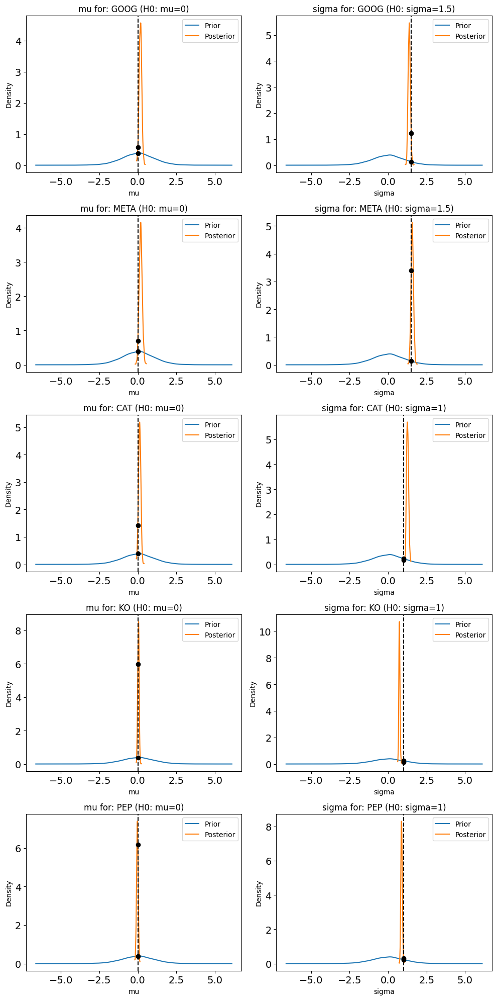

In [23]:
# define the sigma prior values for the null hypothesis (H0) for each stock
stock_h0 = {'GOOG': 1.5, 'META': 1.5, 'CAT': 1, 'KO': 1, 'PEP': 1}

# define the sigma prior values for the null hypothesis (H0) for each stock with a t-distribution
prior_samples = np.random.standard_t(df=10, size=10_000)

stock_names = idata.posterior["sigma"].coords["stock"].values
num_stocks = len(stock_names)

# create a grid of subplots: rows for each stock, 2 columns (one for mu, one for sigma)
fig, axes = plt.subplots(
    nrows=num_stocks,
    ncols=2,
    figsize=(10, num_stocks * 4),
    squeeze=False
)

# loop over each stock (each row in the plot)
for i, stock in enumerate(stock_names):

    
    ax_mu = axes[i, 0]
    mu_samples = idata.posterior['mu'].sel(stock=stock)
    mu_idata = az.InferenceData(posterior=xr.Dataset({'mu': mu_samples}))
    
    az.plot_bf(mu_idata, var_name='mu', ref_val=0, prior=prior_samples, ax=ax_mu)
    ax_mu.set_title(f"mu for: {stock} (H0: mu=0)")

    
    ax_sigma = axes[i, 1]
    sigma_ref_val = stock_h0[stock]
    
    sigma_samples = idata.posterior['sigma'].sel(stock=stock)
    sigma_idata = az.InferenceData(posterior=xr.Dataset({'sigma': sigma_samples}))

    az.plot_bf(
        sigma_idata,
        var_name='sigma',
        ref_val=sigma_ref_val,
        prior=prior_samples,
        ax=ax_sigma
    )
    ax_sigma.set_title(f"sigma for: {stock} (H0: sigma={sigma_ref_val})")


plt.tight_layout()
plt.show()

https://rpsychologist.com/d3/bayes/

## Bayes estimators

**I'm doing bayesian inference on financial data. Is there any use case where I would need a point estimate for a parameter?**

Yes — in **Bayesian inference on financial data**, there are several **practical and theoretical reasons** to use **point estimates** for parameters. Even though Bayesian analysis provides full **posterior distributions**, point estimates are **often necessary** in finance for decisions, modeling, or reporting.

---

 ✅ **1. Portfolio Optimization and Asset Allocation**

Bayesian models often estimate parameters like:

* **Expected returns** $\mu$
* **Volatility** $\sigma$
* **Covariances** $\Sigma$
* **Sharpe ratios** or **betas**

📌 In modern portfolio theory (e.g., Markowitz), you *must* input **point estimates** of expected returns and covariances to compute optimal weights:

$$
\hat{w}^* = \arg\max_w \frac{w^\top \mu}{\sqrt{w^\top \Sigma w}}
$$

If you estimate $\mu \sim \text{Posterior}(\mu)$, you may use:

* Posterior **mean** of $\mu$
* Posterior **mode** (MAP)
* Median, if outliers are a concern

---

 ✅ **2. Risk Management and VaR/ES Estimates**

If you model financial returns using Bayesian models (e.g., GARCH, t-distributions, or Bayesian regression), you may want point estimates for:

* **Volatility forecast**
* **Tail risk parameters**
* **Quantiles** (e.g., VaR, Expected Shortfall)

These are typically derived from point summaries (posterior mean or quantiles of the predictive distribution).

---

 ✅ **3. Reporting to Stakeholders or Regulators**

Stakeholders (clients, managers, regulators) often require **single-number summaries**, such as:

* Expected return for an asset or strategy
* Estimated beta or alpha
* Forecasted volatility

These are typically posterior means or MAPs, perhaps with 95% credible intervals.

---

 ✅ **4. Model Comparison or Selection**

When comparing Bayesian models (e.g., AR, ARMA, GARCH), you often report point estimates of:

* Parameters (for interpretability)
* Model scores (e.g., WAIC, LOO)

You may also plot point estimates across assets or time periods for comparative analysis.

---

✅ **5. Derivative Pricing / Simulation Inputs**

In option pricing or Monte Carlo simulations (e.g., Black-Scholes, Heston), you need parameters like:

* Drift $\mu$
* Volatility $\sigma$
* Correlation $\rho$

Often these are plugged in as posterior **point estimates**, especially in real-time applications where full distributions are impractical.

---

 ✅ **6. Decision-Making: Trading, Hedging, Forecasting**

For strategies that rely on forecasted quantities:

* "Buy if expected return > 2%"
* "Hedge if volatility exceeds 20%"

You need concrete, scalar thresholds → you use point estimates (e.g., posterior mean).

---


 ✅ Summary Table (Finance-Specific)

| Use Case                            | Common Estimate                     |
| ----------------------------------- | ----------------------------------- |
| Portfolio optimization              | Posterior **mean** of $\mu, \Sigma$ |
| VaR / ES / quantile estimation      | Posterior **quantiles** or **mean** |
| Forecasting asset returns           | Posterior **mean** or **median**    |
| Volatility estimation (GARCH, etc.) | Posterior **mean** of $\sigma_t$    |
| Derivative pricing                  | Posterior **mean** or **MAP**       |
| Model reporting or dashboards       | Posterior **mean + CI**             |
| Real-time decision rules            | Posterior **point summary**         |




In [24]:
post_mu = idata.posterior['mu']
post_mu.to_numpy()
post_mu.shape

(2, 1000, 5)

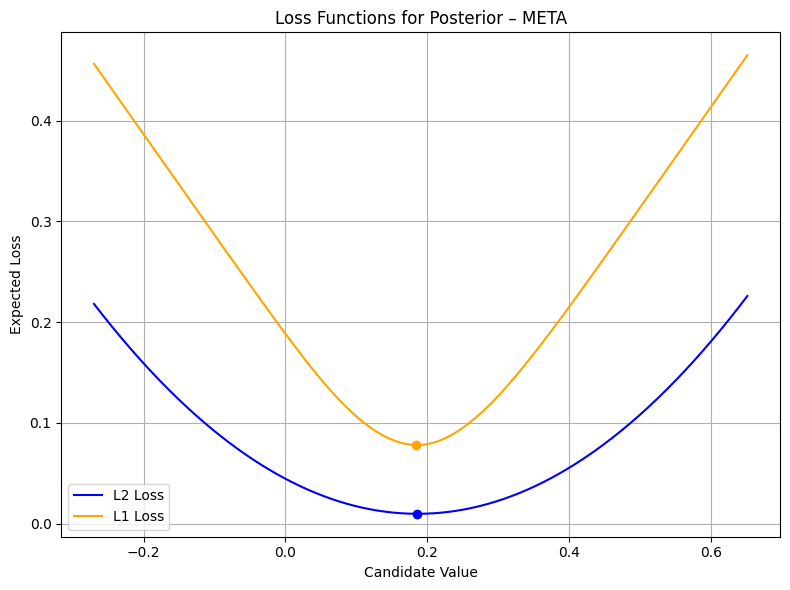

In [25]:
# Select stock index and name
i = 1
stock = 'META'

# Flatten posterior samples for the selected stock
posterior_samples = post_mu.to_numpy().reshape(-1, post_mu.shape[-1])[:, i]

# Range of candidate values to evaluate loss
x_vals = np.linspace(posterior_samples.min() - 0.1,
                     posterior_samples.max() + 0.1, 500)

# Compute L2 and L1 expected loss over x_vals
L2_loss = np.mean((posterior_samples[:, None] - x_vals[None, :])**2, axis=0)
L1_loss = np.mean(np.abs(posterior_samples[:, None] - x_vals[None, :]), axis=0)

# Find x values that minimize each loss
x_L2 = x_vals[np.argmin(L2_loss)]
x_L1 = x_vals[np.argmin(L1_loss)]

# Plot loss curves and minima
plt.figure(figsize=(8, 6))
plt.plot(x_vals, L2_loss, label="L2 Loss", color='blue')
plt.plot(x_vals, L1_loss, label="L1 Loss", color='orange')
plt.scatter([x_L2], [L2_loss.min()], color='blue', zorder=5)
plt.scatter([x_L1], [L1_loss.min()], color='orange', zorder=5)

plt.title(f"Loss Functions for Posterior – {stock}")
plt.xlabel("Candidate Value")
plt.ylabel("Expected Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



Stock 0:
  Posterior mean (L2-optimal): 0.1703
  Posterior median (L1-optimal): 0.1706
  Argmin L2 loss: 0.1704
  Argmin L1 loss: 0.1704


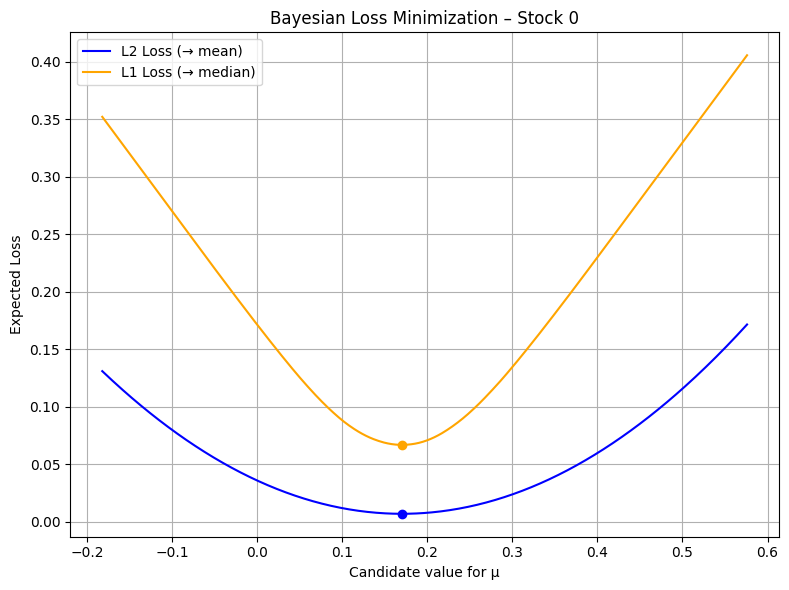


Stock 1:
  Posterior mean (L2-optimal): 0.1866
  Posterior median (L1-optimal): 0.1854
  Argmin L2 loss: 0.1862
  Argmin L1 loss: 0.1844


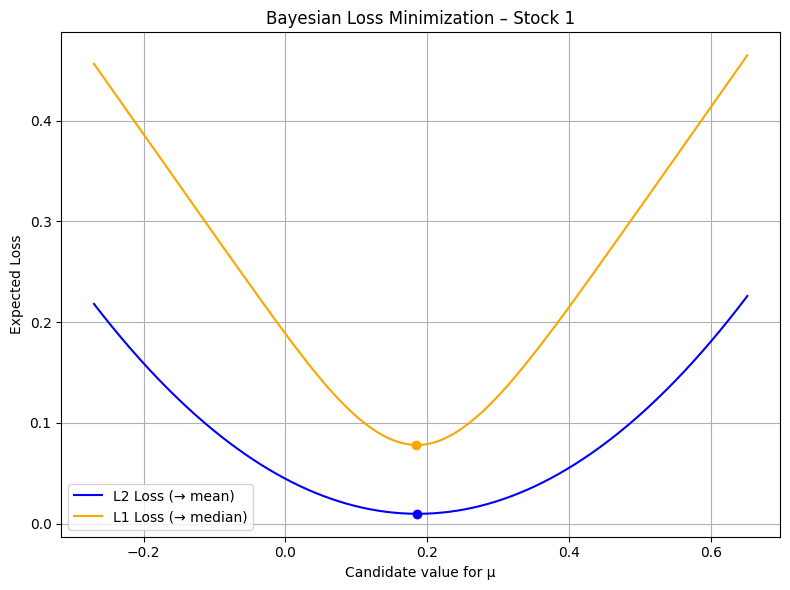


Stock 2:
  Posterior mean (L2-optimal): 0.1200
  Posterior median (L1-optimal): 0.1200
  Argmin L2 loss: 0.1202
  Argmin L1 loss: 0.1202


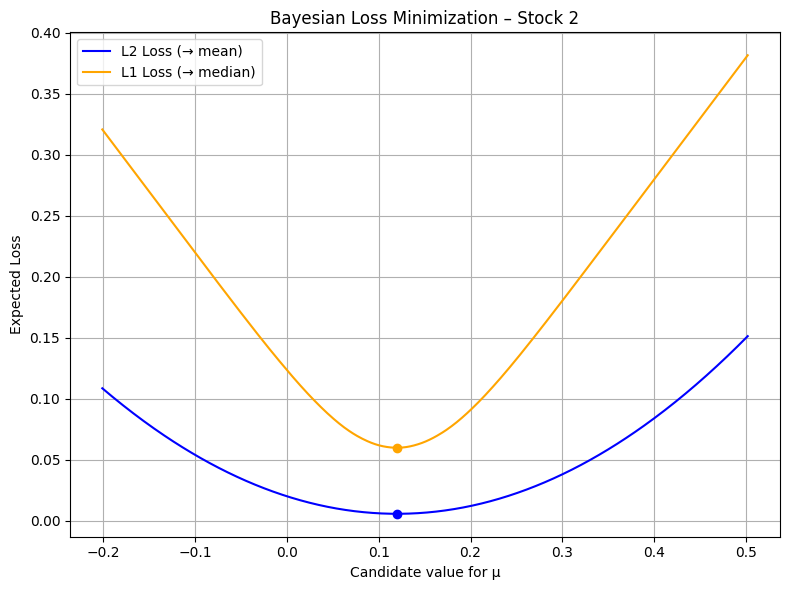


Stock 3:
  Posterior mean (L2-optimal): 0.0390
  Posterior median (L1-optimal): 0.0407
  Argmin L2 loss: 0.0390
  Argmin L1 loss: 0.0412


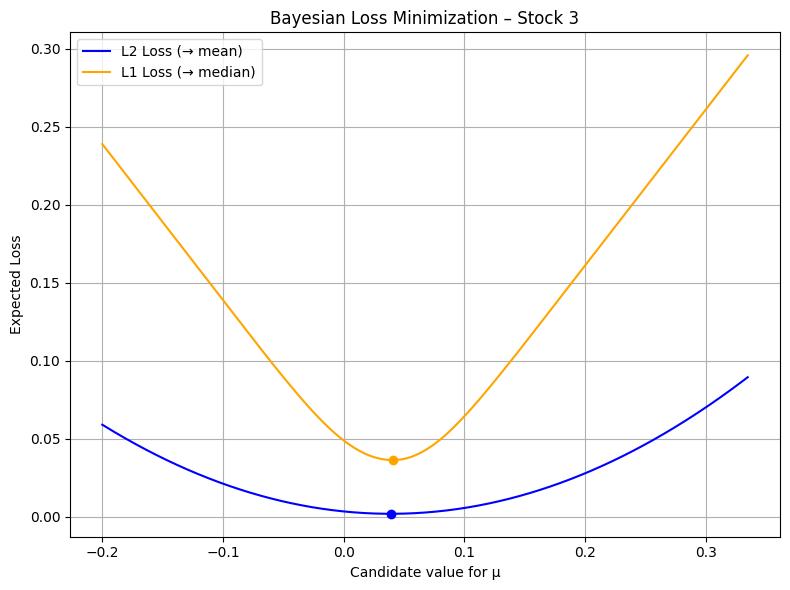


Stock 4:
  Posterior mean (L2-optimal): -0.0289
  Posterior median (L1-optimal): -0.0287
  Argmin L2 loss: -0.0292
  Argmin L1 loss: -0.0292


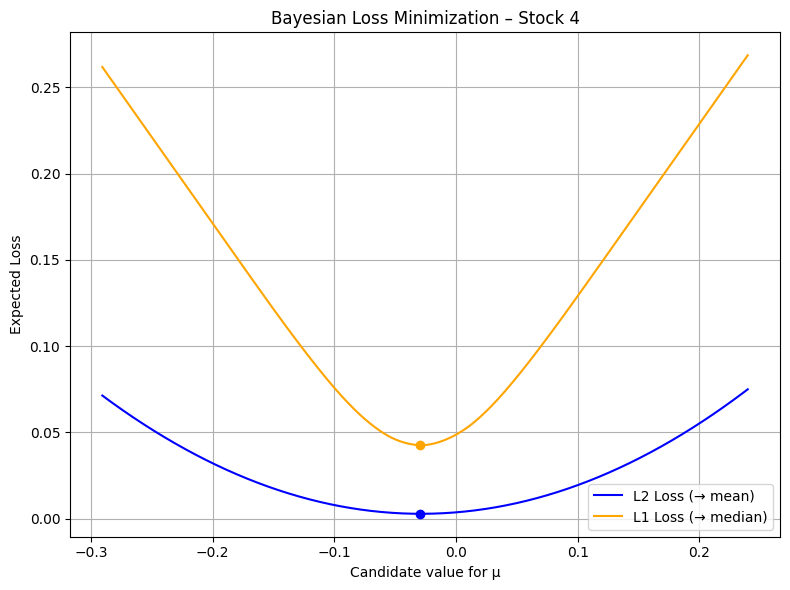

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Convert posterior samples to a 2D array: (num_samples, num_stocks)
post_mu_array = post_mu.to_numpy().reshape(-1, post_mu.shape[-1])
n_stocks = post_mu_array.shape[1]

# Number of candidate points for loss evaluation
n_xvals = 500

# Loop over all stocks (parameters)
for i in range(n_stocks):
    posterior_samples = post_mu_array[:, i]  # Samples for stock i

    # Define a range of candidate values for the parameter
    x_vals = np.linspace(
        posterior_samples.min() - 0.1,
        posterior_samples.max() + 0.1,
        n_xvals
    )

    # Compute expected L2 loss (squared error) for each candidate
    L2_loss = np.mean((posterior_samples[:, None] - x_vals[None, :])**2, axis=0)

    # Compute expected L1 loss (absolute error) for each candidate
    L1_loss = np.mean(np.abs(posterior_samples[:, None] - x_vals[None, :]), axis=0)

    # Find the x value that minimizes each loss
    x_L2 = x_vals[np.argmin(L2_loss)]
    x_L1 = x_vals[np.argmin(L1_loss)]

    # Print the optimal estimators
    print(f"\nStock {i}:")
    print(f"  Posterior mean (L2-optimal): {posterior_samples.mean():.4f}")
    print(f"  Posterior median (L1-optimal): {np.median(posterior_samples):.4f}")
    print(f"  Argmin L2 loss: {x_L2:.4f}")
    print(f"  Argmin L1 loss: {x_L1:.4f}")

    # Plot the loss functions
    plt.figure(figsize=(8, 6))
    plt.plot(x_vals, L2_loss, label="L2 Loss (→ mean)", color='blue')
    plt.plot(x_vals, L1_loss, label="L1 Loss (→ median)", color='orange')
    plt.scatter([x_L2], [L2_loss.min()], color='blue', zorder=5)
    plt.scatter([x_L1], [L1_loss.min()], color='orange', zorder=5)

    plt.title(f"Bayesian Loss Minimization – Stock {i}")
    plt.xlabel("Candidate value for μ")
    plt.ylabel("Expected Loss")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## USING THE ASTIMATOR ON THE REAL DATA

In [27]:

# Convert the posterior samples to a 2D array
post_mu_array = post_mu.to_numpy().reshape(-1, post_mu.shape[-1])  # (2000, 5)


# calculate the L2 distance (Euclidean distance)
L2 = np.mean(np.sum((post_mu_array[:, np.newaxis, :] - y_data[np.newaxis, :, :])**2, axis=-1), axis=0)

# calculate the L1 distance (Manhattan distance)
L1 = np.mean(np.sum(np.abs(post_mu_array[:, np.newaxis, :] - y_data[np.newaxis, :, :]), axis=-1), axis=0)

print("L2 distances:", L2)
print("L1 distances:", L1)

# find the closest vectors
closest_L2 = y_data[L2.argmin()]
closest_L1 = y_data[L1.argmin()]

# calculate the posterior mean and median
posterior_mean = post_mu_array.mean(axis=0)
posterior_median = np.median(post_mu_array, axis=0)


print("Closest vector to posterior mean (L2):\n", closest_L2)
print("Posterior mean:\n", posterior_mean)
print("Closest vector to posterior median (L1):\n", closest_L1)
print("Posterior median:\n", posterior_median)

L2 distances: [9.95092636e+00 4.82810083e+00 4.77584764e+00 8.83621484e+00
 3.23200254e+00 1.22083330e+01 1.24495367e+00 3.14473135e+00
 6.82372558e+00 1.10530109e+01 6.66365379e+00 9.88327835e+00
 2.02826568e+00 3.34932807e+00 6.76810525e+00 1.55591025e+01
 1.10642852e+00 4.34878625e+00 2.99671075e+00 7.16580640e+01
 1.60740474e+01 3.41279469e+02 1.72830823e+01 1.75306898e+00
 9.73210739e+00 2.52552129e+00 1.95919173e+01 6.18791678e+00
 1.72040662e+01 8.94601943e+00 1.34460370e+01 9.81161357e+00
 1.41643018e+01 3.39435000e+00 1.59468648e+01 1.32358088e+00
 2.46863497e+01 2.23923838e+00 5.70965766e+00 5.44992729e+00
 8.50992431e+00 1.08130264e+01 1.04967544e+01 2.85659076e+00
 1.40171692e+01 2.57410834e+00 2.96084582e+01 1.02105593e+01
 4.00720085e+00 6.51751489e+00 8.95929349e+00 4.08679719e+01
 7.74238711e-01 4.86388046e+00 5.65758422e+00 7.14384305e+00
 3.25487030e+00 2.71803486e+00 5.95058787e+00 4.46201901e+00
 1.04221526e+01 3.04005657e+00 1.22702635e+01 1.35512755e+01
 1.6206981

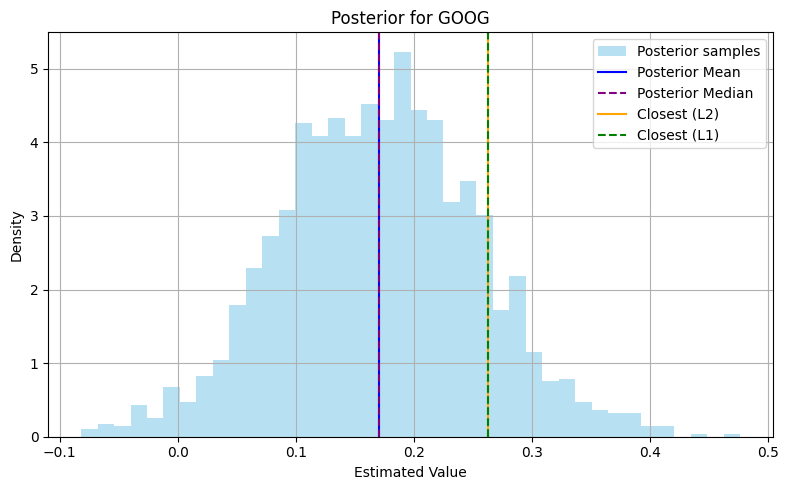

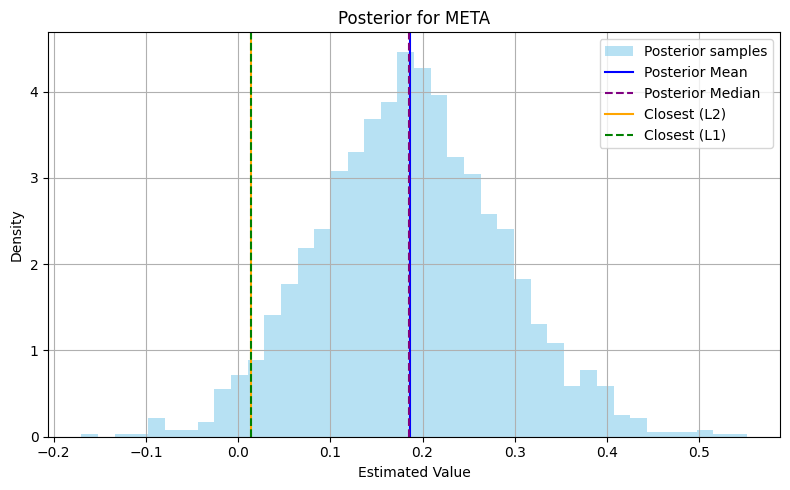

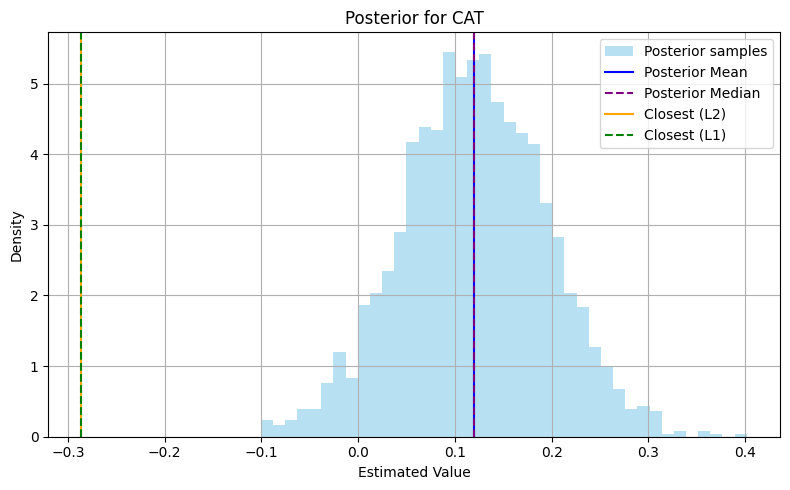

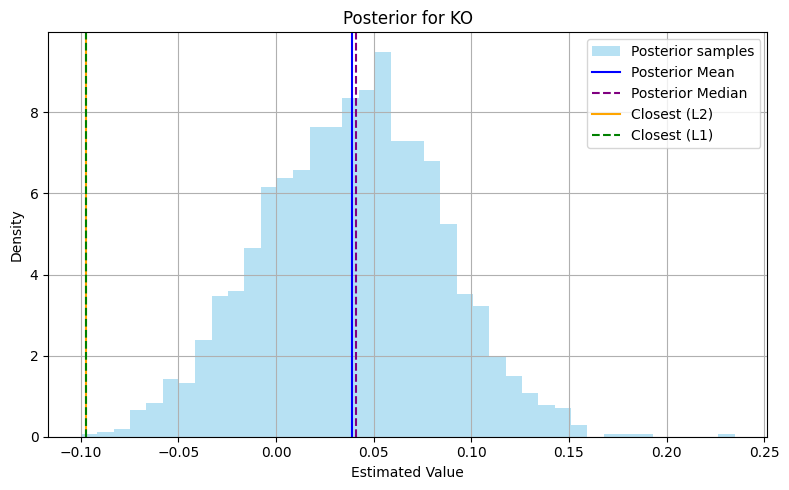

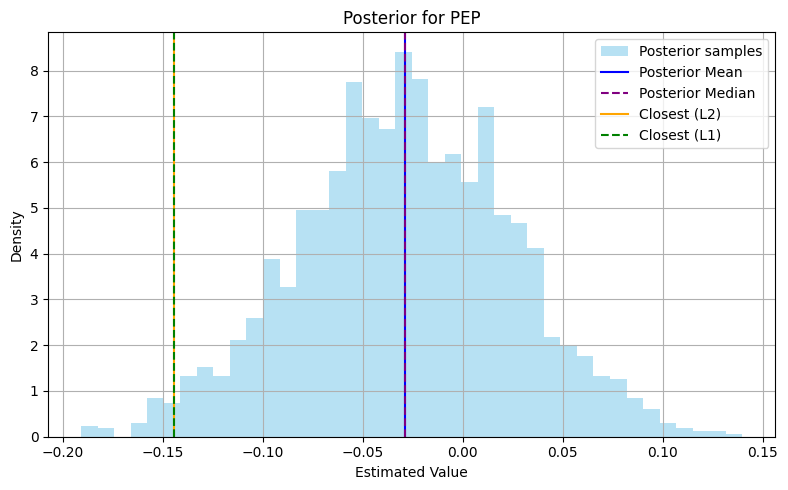

In [28]:
import matplotlib.pyplot as plt



for i, stock in enumerate(stock_names): 
    samples = post_mu_array[:, i]

    plt.figure(figsize=(8, 5))
    
    
    plt.hist(samples, bins=40, density=True, alpha=0.6, color='skyblue', label='Posterior samples')

    
    plt.axvline(posterior_mean[i], color='blue', linestyle='-', label='Posterior Mean')
    plt.axvline(posterior_median[i], color='purple', linestyle='--', label='Posterior Median')
    plt.axvline(closest_L2[i], color='orange', linestyle='-', label='Closest (L2)')
    plt.axvline(closest_L1[i], color='green', linestyle='--', label='Closest (L1)')

    plt.title(f'Posterior for {stock}')
    plt.xlabel('Estimated Value')
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


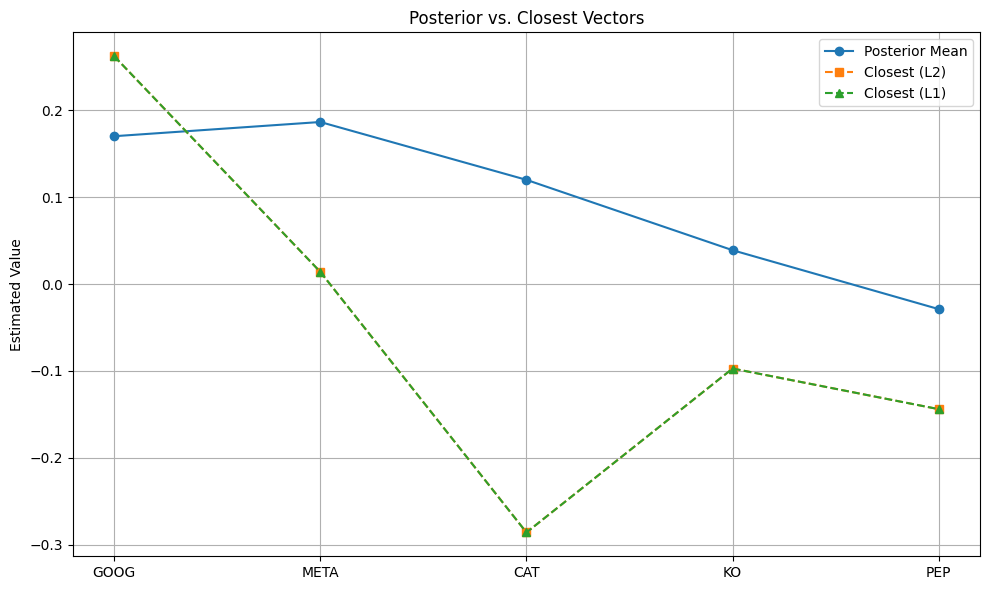

In [29]:
labels = ['GOOG', 'META', 'CAT', 'KO', 'PEP']
x = np.arange(len(labels))

plt.figure(figsize=(10, 6))
plt.plot(x, posterior_mean, marker='o', label='Posterior Mean')
plt.plot(x, closest_L2, marker='s', label='Closest (L2)', linestyle='--')
plt.plot(x, closest_L1, marker='^', label='Closest (L1)', linestyle='--')

plt.xticks(x, labels)
plt.ylabel('Estimated Value')
plt.title('Posterior vs. Closest Vectors')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


/var/folders/jt/w85x3rfd3cq6h1wyk8v8r3sm0000gn/T/ipykernel_8191/1317334794.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(post_mu_array, labels=labels, showfliers=False)


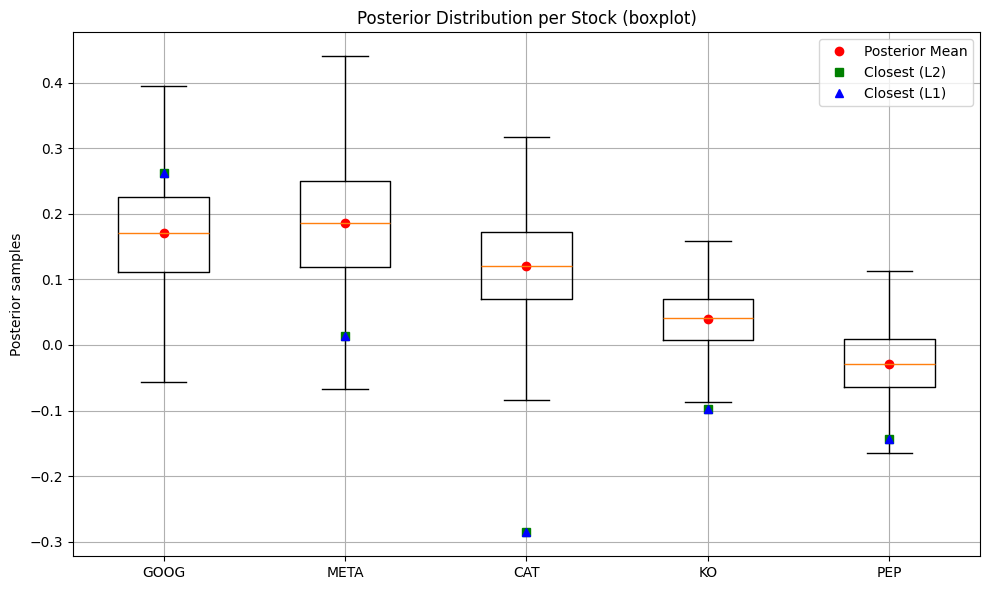

In [ ]:
plt.figure(figsize=(10, 6))
plt.boxplot(post_mu_array, labels=labels, showfliers=False)


plt.plot(x + 1, posterior_mean, 'ro', label='Posterior Mean')  # x+1 כי boxplot מתחיל מ־1
plt.plot(x + 1, closest_L2, 'gs', label='Closest (L2)')
plt.plot(x + 1, closest_L1, 'b^', label='Closest (L1)')

plt.ylabel("Posterior samples")
plt.title("Posterior Distribution per Stock (boxplot)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


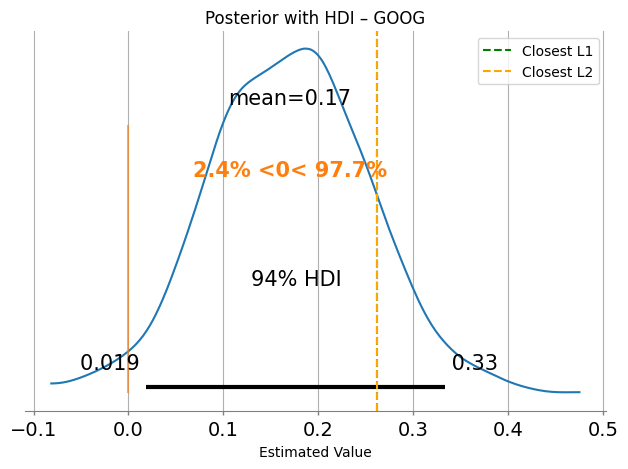

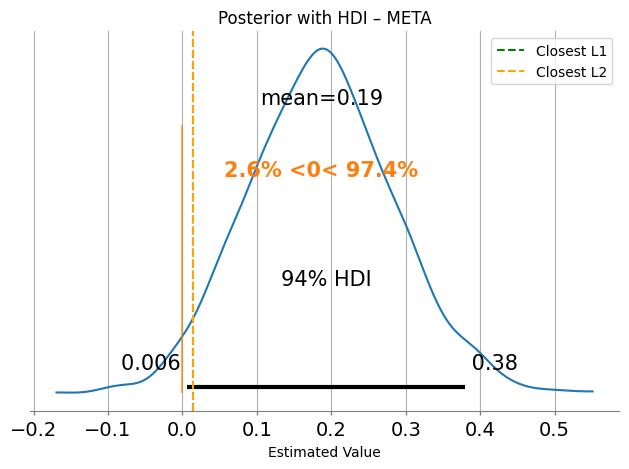

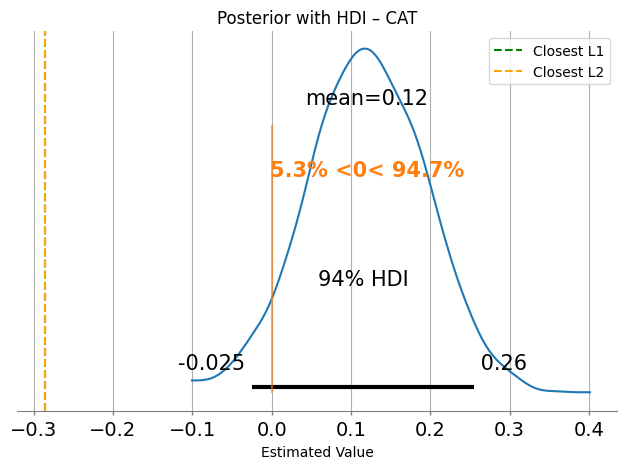

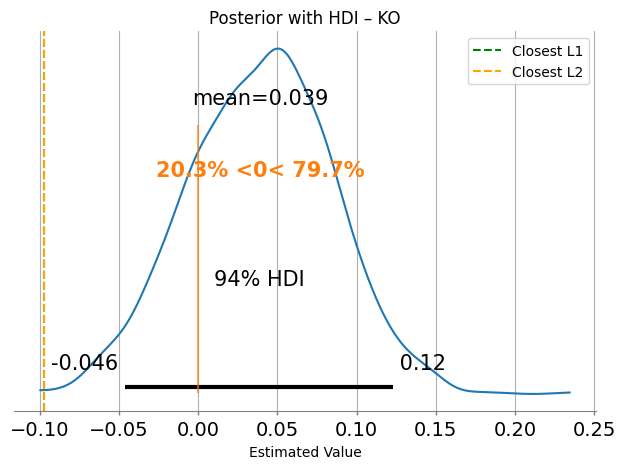

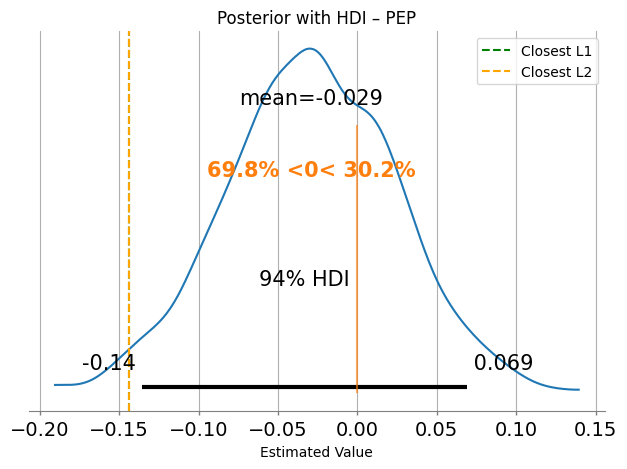

In [ ]:


labels = ['GOOG', 'META', 'CAT', 'KO', 'PEP']
post_mu_array = post_mu.to_numpy().reshape(-1, post_mu.shape[-1])


for i, stock in enumerate(labels):
    ax = az.plot_posterior(
        post_mu_array[:, i],
        hdi_prob=0.94,
        point_estimate="mean",
        ref_val=0,
        rope=None
    )


    ax.axvline(closest_L1[i], color='green', linestyle='--', label='Closest L1')
    ax.axvline(closest_L2[i], color='orange', linestyle='--', label='Closest L2')


    plt.title(f"Posterior with HDI – {stock}")
    plt.xlabel("Estimated Value")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


# BAYSIAN REGRESSION

In [32]:

x = np.arange(len(y_data))  # length of time series (days)
y = y_data.mean(axis=1)     # average daily returns (Y-axis)

# data preparation for PyMC
data = pd.DataFrame({'x': x, 'y': y})

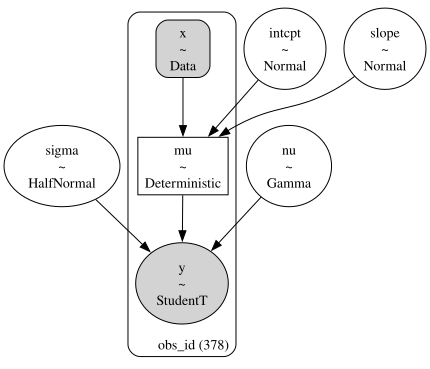

In [33]:
with pm.Model(coords=coords) as t_regression_deterministic:
    #  prior
    intcpt = pm.Normal("intcpt", mu=0, sigma=1)
    slope = pm.Normal("slope", mu=0, sigma=1)
    sigma = pm.HalfNormal("sigma", sigma=1)
    nu = pm.Gamma("nu", alpha=0.5, beta=1)

    # data
    x_ = pm.Data("x", data["x"], dims="obs_id")
    
    # we define the regression line as a deterministic variable    
    mu = pm.Deterministic("mu", intcpt + slope * x_, dims="obs_id")

    # מודל עם StudentT (משתמש במשתנה הדטרמיניסטי mu)
    y = pm.StudentT("y", mu=mu, sigma=sigma, nu=nu, observed=data["y"], dims="obs_id")


graph = pm.model_to_graphviz(t_regression_deterministic)
display(graph)

In [34]:

with t_regression_deterministic:
    #step = pm.Metropolis() 
    trace = pm.sample(2000, tune=4000, return_inferencedata=True)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intcpt, slope, sigma, nu]


Output()

Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 2 seconds.


array([[<Axes: title={'center': 'intcpt'}>,
        <Axes: title={'center': 'intcpt'}>],
       [<Axes: title={'center': 'slope'}>,
        <Axes: title={'center': 'slope'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'nu'}>, <Axes: title={'center': 'nu'}>],
       [<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>]],
      dtype=object)

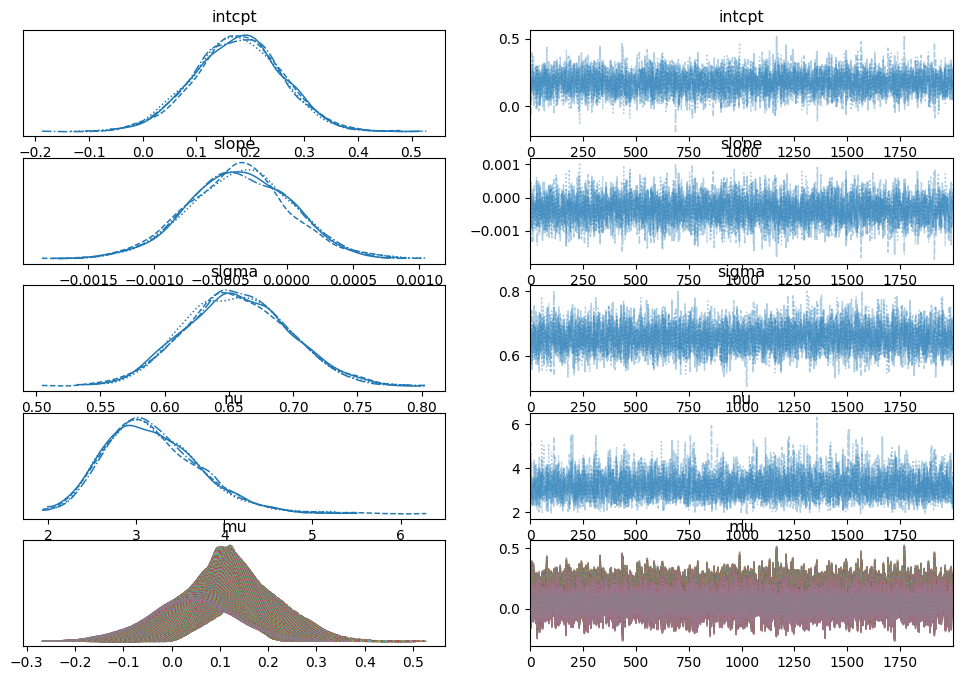

In [35]:
az.plot_trace(trace, figsize=(12, 8))

https://chi-feng.github.io/mcmc-demo/app.html?algorithm=RandomWalkMH&target=banana

In [36]:
with t_regression_deterministic:
    ppc = pm.sample_posterior_predictive(
        trace,
        var_names=["mu", "y"] 
    )

Sampling: [y]


Output()

/var/folders/jt/w85x3rfd3cq6h1wyk8v8r3sm0000gn/T/ipykernel_8191/2300480556.py:27: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  ci_low, ci_high = az.hdi(mu_pred_on_grid, hdi_prob=0.95).T
/var/folders/jt/w85x3rfd3cq6h1wyk8v8r3sm0000gn/T/ipykernel_8191/2300480556.py:31: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  pi_low, pi_high = az.hdi(y_draws.T, hdi_prob=0.95).T # Predictive HDI


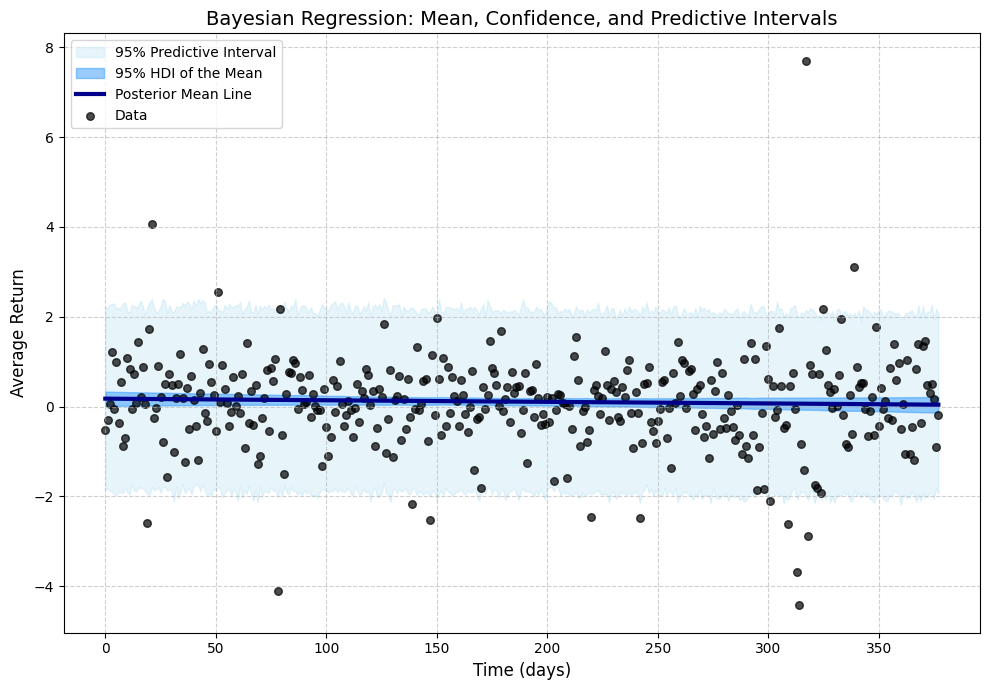

In [37]:


# --- 2. Prepare the data for plotting ---
# Define a grid of x-values for a smooth plot line
x_pred_grid = np.linspace(data['x'].min(), data['x'].max(), 200)

# Reshape the PPC draws to be easier to work with.
# Note the change from "y_hat" to "mu" and "y_pred" to "y"
mu_draws = (
    ppc.posterior_predictive["mu"]
        .stack(sample=("chain", "draw"))
        .values
)
y_draws = (
    ppc.posterior_predictive["y"]
        .stack(sample=("chain", "draw"))
        .values
)

# This part is a bit tricky: your model was fit on the original x values, not a grid.
# So we need to calculate the predicted line 'mu' for our new 'x_pred_grid'.
alpha_samples = trace.posterior["intcpt"].stack(samples=("chain", "draw")).values
beta_samples = trace.posterior["slope"].stack(samples=("chain", "draw")).values
mu_pred_on_grid = np.array([a + b * x_pred_grid for a, b in zip(alpha_samples, beta_samples)])


# --- 3. Calculate the Mean Line and HDIs ---
mean_line = mu_pred_on_grid.mean(axis=0)
ci_low, ci_high = az.hdi(mu_pred_on_grid, hdi_prob=0.95).T

# --- FIX IS HERE ---
# We transpose y_draws to have shape (samples, observations) before calculating the HDI
pi_low, pi_high = az.hdi(y_draws.T, hdi_prob=0.95).T # Predictive HDI


# --- Plot Everything (No changes needed here) ---
plt.figure(figsize=(10, 7))

# The x-axis for the predictive interval should be the original data['x']
# as each point in pi_low/pi_high corresponds to a point in data['x']
plt.fill_between(data['x'], pi_low, pi_high, alpha=0.20, color="skyblue",
                 label="95% Predictive Interval")

# The x-axis for the mean line's HDI is the new grid
plt.fill_between(x_pred_grid, ci_low, ci_high, alpha=0.45, color="dodgerblue",
                 label="95% HDI of the Mean")

plt.plot(x_pred_grid, mean_line, lw=3, color="darkblue", label="Posterior Mean Line")
plt.scatter(data['x'], data['y'], s=30, color="black", alpha=0.7, label="Data")

plt.xlabel("Time (days)", fontsize=12)
plt.ylabel("Average Return", fontsize=12)
plt.title("Bayesian Regression: Mean, Confidence, and Predictive Intervals", fontsize=14)
plt.legend(loc="upper left")
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [ ]:


# 1. גש למשתנה הרצוי (למשל, 'y') בתוך התחזיות הפוסטריוריות
# התוצאה היא אובייקט xarray.DataArray
posterior_y = ppc.posterior_predictive['y']

variances_per_y = posterior_y.var(dim=('chain', 'draw'))

# הדפסת התוצאות לבדיקה
print("חישוב השונות עבור כל נקודת Y הושלם.")
print(f"צורת מערך השונויות: {variances_per_y.shape}")

print(variances_per_y.values)
print(type(variances_per_y))
print(variances_per_y.shape)
# 2. שטّח את כל הדגימות מכל השרשראות למערך אחד ארוך
# הפונקציה .values מוציאה את מערך ה-NumPy מתוך אובייקט ה-xarray
all_samples = posterior_y.values.flatten()


# replace=False מבטיח שכל דגימה נבחרת פעם אחת בלבד
random_samples = np.random.choice(all_samples, size=num_days, replace=False)

# הדפסת התוצאה לבדיקה
print(f"נדגמו {len(random_samples)} ערכים.")
print("חמשת הערכים הראשונים במדגם האקראי:")
print(random_samples[:5])

volatility_per_y = np.sqrt(variances_per_y.values)

# 2. צור DataFrame חדש המכיל את כל הנתונים
# אנו יוצרים מילון שבו כל מפתח הוא שם עמודה והערך הוא סדרת הנתונים
results_df = pd.DataFrame({
    'postrior_y': random_samples,  # ערכי ה-Y המקוריים
    'predicted_variance': variances_per_y.values,  # השונות החזויה לכל Y
    'predicted_volatility': volatility_per_y  # התנודתיות החזויה (סטיית התקן)
})

# 3. הדפס את חמש השורות הראשונות של הטבלה החדשה
print("טבלה המציגה לכל Y את התנודתיות החזויה שלו:")
print(results_df.head())
print(results_df.shape)

חישוב השונות עבור כל נקודת Y הושלם.
צורת מערך השונויות: (378,)
[1.12161552 1.26832239 1.26982812 1.13686887 1.23033405 1.22537993
 1.13314663 1.26661263 1.56854616 1.2506539  1.22998107 1.33206984
 1.16134219 1.15483732 2.45566024 1.12209242 1.23721877 1.27614922
 1.14541249 1.27966753 1.79728464 1.30822954 1.22929914 1.16375545
 1.07679531 1.45847678 1.27790151 1.17709606 1.23039488 1.37701293
 1.07436872 1.25634969 1.12081771 1.36529935 1.24052196 1.18167773
 1.24062348 1.14400497 3.47386591 1.20669878 1.25610657 1.3606803
 1.11166596 1.26528624 1.18972222 1.24777485 1.46860366 1.43363936
 1.57110224 1.08836645 1.32142908 1.35071778 1.29772888 1.17755419
 1.30917359 1.21067726 1.2622171  1.29510865 1.0885823  1.25115692
 1.28404431 1.22983453 1.23091144 1.23465828 1.13899747 1.10986993
 1.2541197  1.26029811 1.28466056 1.32867182 1.11002775 1.16836202
 1.13246197 1.26885579 1.22858311 1.13214193 1.14162886 1.16185442
 1.16293134 1.3088458  1.20598398 1.30063115 1.15324204 1.09221594


In [39]:
# מחיר התחלתי - אפשר לקחת אותו מהדאטה האמיתי שלך:
P0 = prices_clean.mean(axis=1).iloc[0]  # ממוצע מחירים ביום הראשון
print(f"מחיר התחלתי P0: {P0}")


# נניח שהתשואות הן באחוזים → צריך לחלק ב־100
returns = 1 + (random_samples/100)

print(returns)
print(type(returns))

cumulative_returns = np.cumprod(returns)
print(cumulative_returns)

price_paths = P0 * (cumulative_returns)

print(type(price_paths))

print(price_paths)



upper_band = price_paths * ((100 + 2*volatility_per_y)/100)
lower_band = price_paths * ((100 - 2*volatility_per_y)/100)


מחיר התחלתי P0: 198.05731582641602
[0.9984833  1.01028393 0.99833607 1.01630653 0.99464024 1.01172637
 1.00405113 1.01045079 1.00258778 1.00426259 1.00075384 1.00587048
 1.00471581 1.02365617 1.02426923 0.99526449 0.99909261 1.00515021
 0.99958017 1.00266212 0.99713541 1.00154964 0.96931141 0.97529555
 0.99446177 1.00213434 0.94086409 0.99809915 0.98888196 1.00827219
 0.99556275 0.99564261 1.00721068 0.99000609 1.0001955  0.99740475
 1.01557514 1.00285511 1.00063832 1.00596471 0.99574786 1.00476839
 1.00425884 1.00591044 1.01727783 1.00318328 1.00162394 0.99592806
 1.00226677 0.99313079 1.01462452 0.98759759 1.02313482 1.00822258
 0.99694843 0.98917213 0.99739096 0.99484979 1.00088805 1.00198947
 1.00248202 0.99808277 0.99077239 1.00154071 0.98594312 1.00648787
 1.02166918 1.003152   1.0071089  0.97774058 1.01570943 1.00332851
 0.99663188 1.00004328 1.00506783 1.00220537 1.00047107 1.02014203
 0.99200081 0.99520612 0.98870149 1.00471606 1.00734822 1.00399137
 0.99709839 1.00175178 1.00

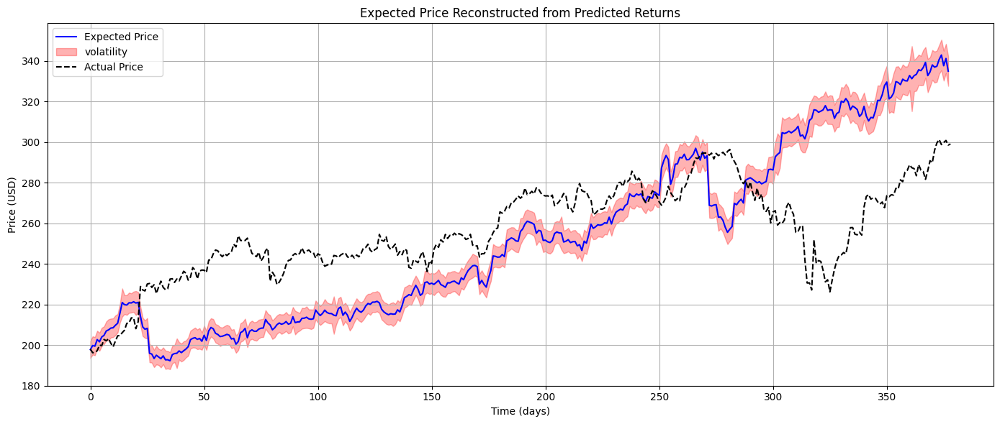

In [40]:
plt.figure(figsize=(14, 6))
plt.plot(np.arange(len(price_paths)), price_paths, label="Expected Price", color="blue")
plt.fill_between(np.arange(len(price_paths)), lower_band, upper_band, alpha=0.3, label="volatility", color="red")
plt.title("Expected Price Reconstructed from Predicted Returns")
plt.xlabel("Time (days)")
plt.ylabel("Price (USD)")
real_prices = prices_clean.mean(axis=1).values
plt.plot(np.arange(len(real_prices)), real_prices, label="Actual Price", color="black", linestyle="--")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

array([[<Axes: >, None],
       [<Axes: xlabel='intcpt', ylabel='slope'>, <Axes: >]], dtype=object)

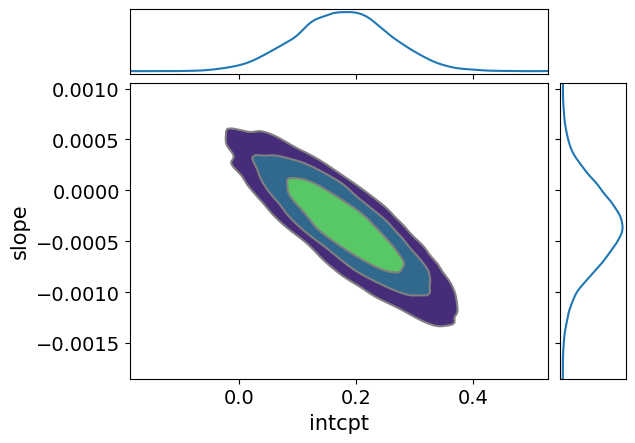

In [41]:
az.plot_pair(trace, var_names=["intcpt", "slope"], kind="kde", marginals=True)

In [42]:
az.summary(trace, var_names=["slope", "intcpt"], hdi_prob=0.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
slope,-0.000,0.000,-0.001,0.000,0.000,0.000,5363.0,4482.0,1.0
intcpt,0.177,0.081,0.015,0.333,0.001,0.001,5369.0,4953.0,1.0


array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

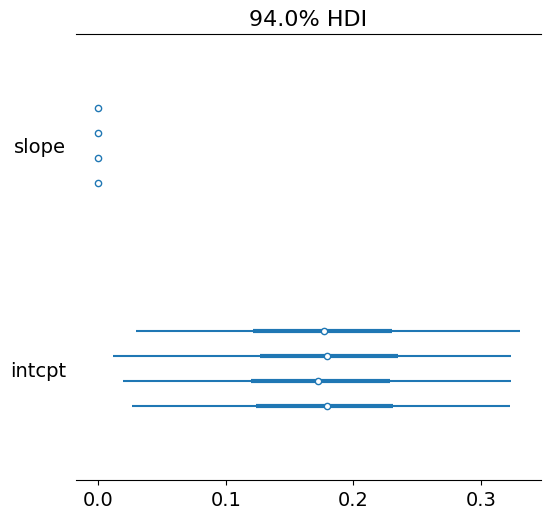

In [43]:
az.plot_forest(trace, var_names=["slope", "intcpt"])


## GRID METHOD

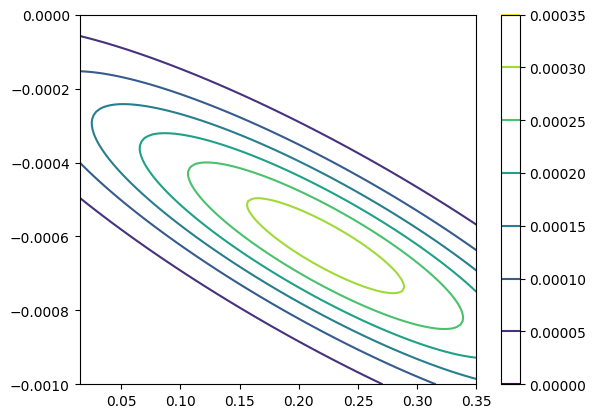

In [44]:
import scipy.stats as stats
n = 100
intcpt_sup = np.linspace(0.015, 0.35, n)
slope_sup = np.linspace(-0.001, 0, n)
prior_i = stats.norm.pdf(intcpt_sup, loc=0, scale=10)
prior_s = stats.norm.pdf(slope_sup, loc=0, scale=10)

likelihood = np.empty((n,n))
posterior = np.empty((n,n))
for i in range(n):
  for j in range(n):
    y_mean = intcpt_sup[i]+slope_sup[j]*data.x
    likelihood[i,j] = stats.norm.pdf(data.y,loc=y_mean,scale=1).prod()
    posterior[i,j] = prior_i[i] * prior_s[j] * likelihood[i,j]
    #Chat, Why is the previous line problematic? Mention underflow.
posterior /= posterior.sum()

contour = plt.contour(intcpt_sup, slope_sup, posterior)
plt.colorbar(contour)

# MCMC

**למה mcmc לא טוב?**
- יכול להיות שאם סיגמא קטן מידי או גדול מידי נראה חלק קטן מההתפלגות ולא את כולה 
- בעיית גיאומטריה כמו בfunnel שנתקע באיזור מסויים
- במולטי מודל הדגימות לא הקפצו לאיזורים אחרים

**למה המילטון יותר טוב?**
- מתרחקים מהנקודה הנוכחית וככה מקבלים דגימות עם קורולציה נמוכה יותר (איזורים אחרים)
- מקבלים את המועמד הבא עם הסתברות גבוהה = פחות איטרציות

https://chi-feng.github.io/mcmc-demo/app.html?algorithm=RandomWalkMH&target=banana

## BAD HIERARCHICAL MODEL

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/pymc/data.py:265: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(


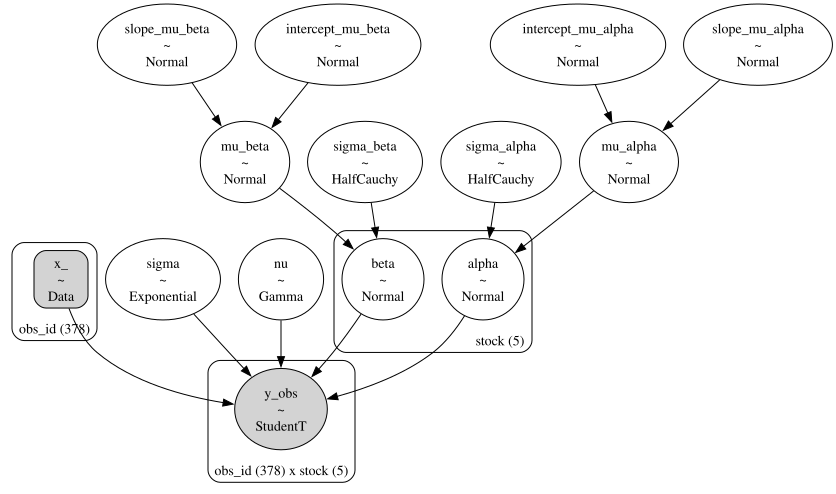

In [45]:

# T: number of time points (e.g., days)
# N: number of stocks
T, N = y_data.shape

# Define coordinate names for ArviZ & PyMC to track dimensions
coords = {
    "obs_id": np.arange(T),    # Each time observation
    "stock": TICKERS           # List of stock symbols
}

with pm.Model(coords=coords) as h_model:

    # ---------------------------
    # Input Data
    # ---------------------------

    # x_ is the time variable (e.g., 0, 1, ..., T-1)
    # Declared as mutable so we can later change it for prediction
    x_ = pm.MutableData("x_", np.arange(T), dims="obs_id")

    # ---------------------------
    # Hyperpriors for Group-Level Means and Scales
    # ---------------------------

    # Priors for the group mean and standard deviation of intercepts
    intercept_mu_alpha = pm.Normal("intercept_mu_alpha", 0, sigma=1)
    intercept_mu_beta = pm.Normal("intercept_mu_beta",0, sigma=1)

    # Priors for the group mean and standard deviation of slopes
    slope_mu_alpha = pm.Normal("slope_mu_alpha", 0, sigma=1)
    slope_mu_beta = pm.Normal("slope_mu_beta",0, sigma=1)

    # ---------------------------
    # Hierarchical Priors
    # ---------------------------

    # Mean and std for intercepts across all stocks
    mu_alpha = pm.Normal("mu_alpha", mu=intercept_mu_alpha, sigma=slope_mu_alpha)
    sigma_alpha = pm.HalfCauchy("sigma_alpha", beta=0.1)

    # Mean and std for slopes across all stocks
    mu_beta = pm.Normal("mu_beta", mu=intercept_mu_beta, sigma=slope_mu_beta)
    sigma_beta = pm.HalfCauchy("sigma_beta", beta=0.1)

    # ---------------------------
    # Stock-Specific Parameters (Intercepts and Slopes)
    # ---------------------------

    # One alpha (intercept) and one beta (slope) per stock
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, dims="stock")
    beta = pm.Normal("beta", mu=mu_beta, sigma=sigma_beta, dims="stock")

    # ---------------------------
    # Observation Noise and Likelihood
    # ---------------------------

    # Shared noise level for all observations
    sigma = pm.Exponential("sigma", lam=5)

    # Degrees of freedom for the Student-t distribution
    # Gives robustness to outliers
    nu = pm.Gamma("nu", alpha=2, beta=0.1)

    # Compute expected value (mean) for each stock at each time point
    # Shape: (T observations, N stocks)
    mu = alpha[None, :] + beta[None, :] * x_[:, None]

    # Observation model: Student-t distribution to account for fat tails
    y_obs = pm.StudentT(
        "y_obs",
        nu=nu,
        mu=mu,
        sigma=sigma,
        observed=y_data,
        dims=("obs_id", "stock")
    )

# Optional: visualize the model graph
graph = pm.model_to_graphviz(h_model)
display(graph)


$$
y_{t,i} \sim \mathrm{StudentT}(\nu,\ \mu_{t,i},\ \sigma)
$$  
התשואה של מניה \(i\) בזמן \(t\) מתפלגת לפי התפלגות Student-t עם תוחלת \(\mu_{t,i}\), שונות \(\sigma\), ודרגות חופש \(\nu\).  
זה מעניק גמישות ומאפשר התמודדות עם רעשים חריגים (outliers).

---

$$
\mu_{t,i} = \alpha_i + \beta_i \cdot t
$$  
התוחלת \(\mu_{t,i}\) של התשואה נבנית ממודל לינארי בזמן:  
קבוע ספציפי למניה \(\alpha_i\) ושיפוע בזמן \(\beta_i\).

---

$$
\alpha_i \sim \mathcal{N}(\mu_\alpha,\ \sigma_\alpha)
$$  
הקבוע של מניה \(i\) נמשך מהתפלגות נורמלית משותפת לכל המניות —  
עם תוחלת \(\mu_\alpha\) ושונות \(\sigma_\alpha\).  
זהו החלק ההיררכי: כל מניה מושפעת מהקבוצה.

---

$$
\beta_i \sim \mathcal{N}(\mu_\beta,\ \sigma_\beta)
$$  
גם השיפוע של כל מניה נמשך מהתפלגות נורמלית —  
עם תוחלת \(\mu_\beta\) ושונות \(\sigma_\beta\).  
כך ניתן ללמוד דפוס כללי לשיפוע בין כל המניות.

---

$$
\mu_\alpha \sim \mathcal{N}(\text{intercept\_mu\_alpha},\ \text{slope\_mu\_alpha})
$$  
התוחלת של הקבועים נמשכת בעצמה מהתפלגות נורמלית —  
היפר־פריור שמאפשר למודל ללמוד גם את מרכז הקבועים.

---

$$
\sigma_\alpha \sim \mathrm{HalfCauchy}(0,\ 0.1)
$$  
השונות בין הקבועים נמשכת מהתפלגות Half-Cauchy —  
מתאימה למודלים היררכיים ומאפשרת שונות גבוהה אם צריך.

---

$$
\mu_\beta \sim \mathcal{N}(\text{intercept\_mu\_beta},\ \text{slope\_mu\_beta})
$$  
התוחלת של השיפועים נמשכת מפריור נורמלי עם שני היפר־פרמטרים —  
מאפשר גמישות בהבנת השיפועים הקבוצתיים.

---

$$
\sigma_\beta \sim \mathrm{HalfCauchy}(0,\ 0.1)
$$  
השונות בין השיפועים across stocks נמשכת מחלוקת חצי־קושי —  
גם כאן מדובר בפריור גמיש עם זנבות כבדים.

---

$$
\sigma \sim \mathrm{Exponential}(5)
$$  
השונות של השאריות (ה"רעש") בתשואות המודלוּת —  
היא קבועה לכל המניות והזמנים ונמשכת מהתפלגות מעריכית.

---

$$
\nu \sim \mathrm{Gamma}(2,\ 0.1)
$$  
דרגות החופש של התפלגות Student-t, נמשכות מהתפלגות גאמא.  
מאפשר שליטה על מידת "עובי הזנבות" — ערך קטן ייתן התפלגות עם זנבות כבדים.


In [46]:
with h_model:
    h_data = pm.sample(
        1000, tune=1000, target_accept=0.8, return_inferencedata=True
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept_mu_alpha, intercept_mu_beta, slope_mu_alpha, slope_mu_beta, mu_alpha, sigma_alpha, mu_beta, sigma_beta, alpha, beta, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 24 seconds.
There were 1634 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


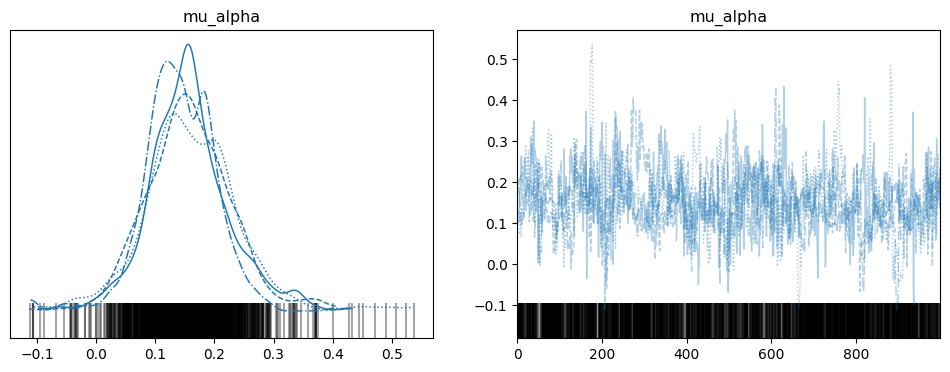

In [47]:
az.plot_trace(h_data,var_names=["mu_alpha"], figsize=(12, 4))
plt.subplots_adjust(hspace = 0.5)
plt.show()

array([[<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'beta'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'nu'}>,
        <Axes: title={'center': 'nu'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}, xlabel='Rank (all chains)', ylabel='Chain'>],
       [<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}, xlabel='Rank (all chains)', ylabel='Chain'>]],
      dtype=object)

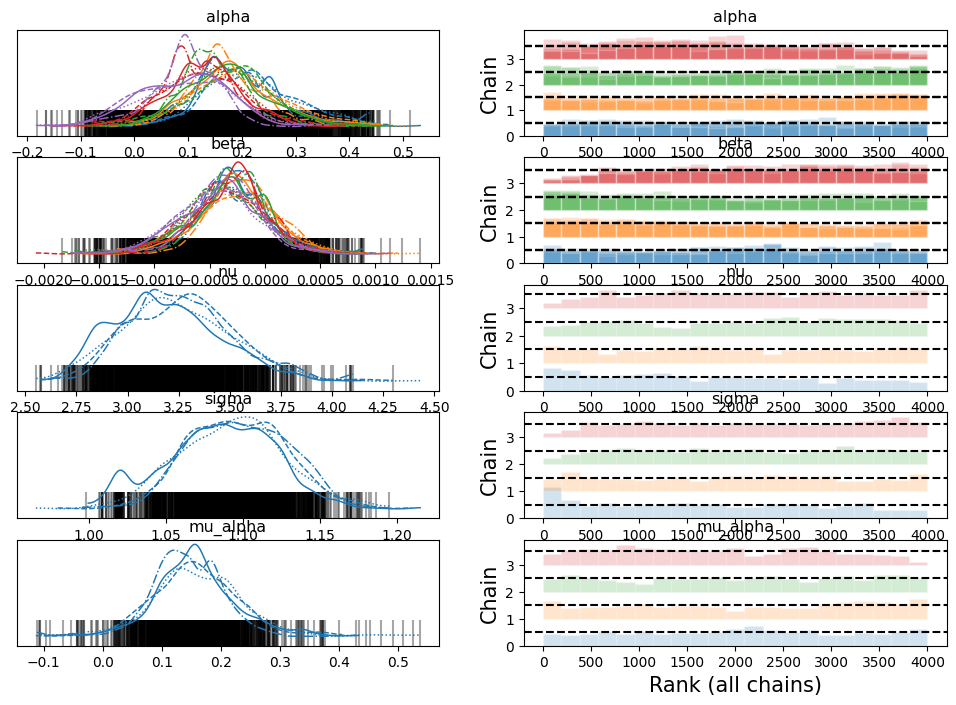

In [48]:
az.plot_trace(
    h_data,
    kind="rank_bars",
    var_names=["alpha", "beta", "nu", "sigma","mu_alpha"],
    compact=True,           
    figsize=(12, 8),         
    combined=False           
)


**RANK BARS**

אפשר לראות שהשרשראות לא דוגמות באופן מאוזן למשל שרשרת 3 דוגמת יותר ערכים קטנים משרשרת 0 באופן משמעותי

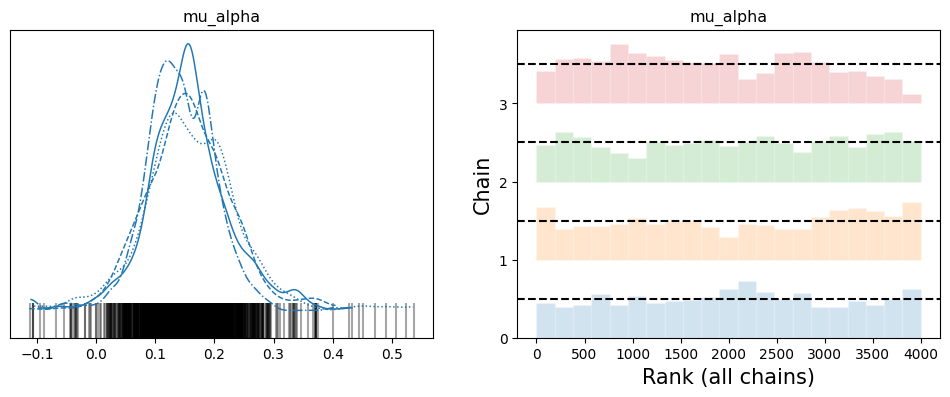

In [49]:
az.plot_trace(h_data, kind="rank_bars", var_names=["mu_alpha"], figsize = (12, 4));

**AUTOCORR**

כאן אפשר לראות את הקורולציה בין הדגימות ואפשר לראות שלכל אורך הדרך יש קורולציה גבוהה בין הדגימות

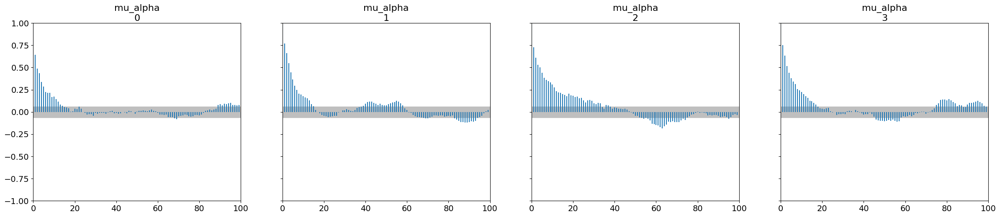

In [50]:
az.plot_autocorr(h_data, var_names=["mu_alpha"]);

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/pairplot.py:223: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


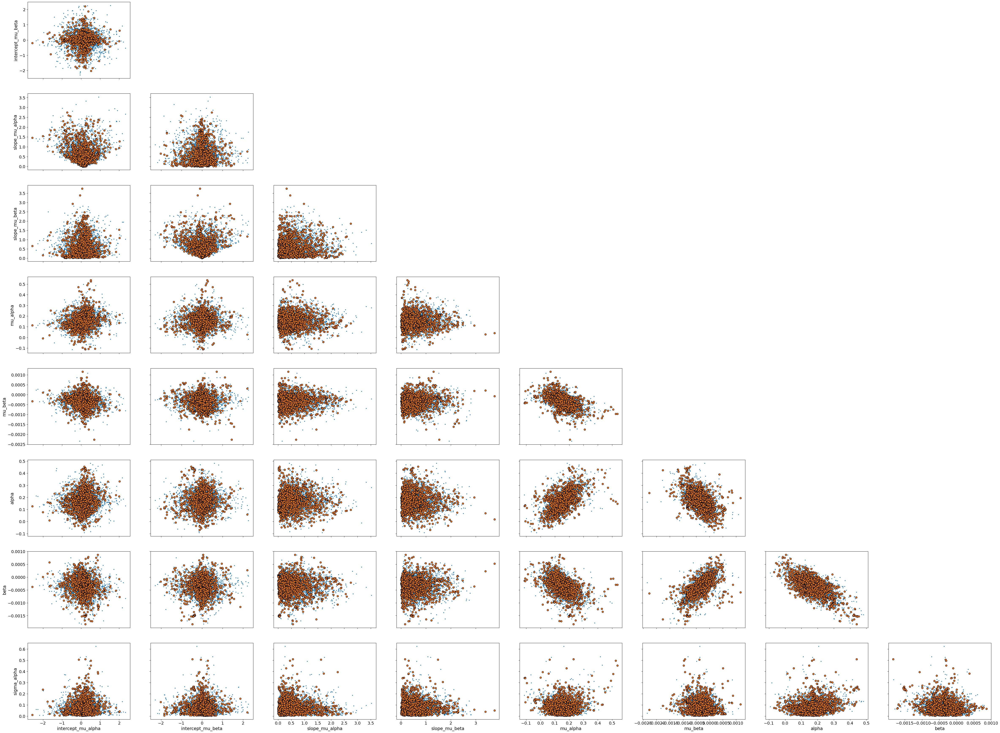

In [51]:
az.plot_pair(h_data,coords = {"stock": "CAT"}, kind='scatter', divergences=True);

- ESS BULK - HOW MANY INDEPNDET SAMPLES WE HAVE
- ESS TAIL - BAD TAIL ASSASMENT 
- R_HAT - OPTIMAL AT 1

In [52]:
az.summary(h_data)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept_mu_alpha,0.106,0.504,-0.941,1.032,0.016,0.019,1031.0,960.0,1.01
intercept_mu_beta,-0.014,0.515,-1.121,1.008,0.016,0.021,985.0,1116.0,1.01
slope_mu_alpha,0.633,0.524,0.006,1.635,0.025,0.019,322.0,378.0,1.02
slope_mu_beta,0.623,0.502,0.010,1.540,0.024,0.015,364.0,705.0,1.00
mu_alpha,0.154,0.071,0.018,0.282,0.004,0.003,289.0,493.0,1.01
mu_beta,-0.000,0.000,-0.001,0.000,0.000,0.000,220.0,416.0,1.02
alpha[GOOG],0.205,0.083,0.049,0.369,0.005,0.003,266.0,457.0,1.02
alpha[META],0.186,0.082,0.040,0.349,0.005,0.003,313.0,492.0,1.02
alpha[CAT],0.170,0.079,0.026,0.328,0.005,0.003,296.0,461.0,1.02
alpha[KO],0.124,0.073,-0.009,0.261,0.004,0.003,363.0,561.0,1.01


בעיה באחוזונים?

<Axes: title={'center': 'mu_alpha'}, xlabel='Quantile', ylabel='ESS for small intervals'>

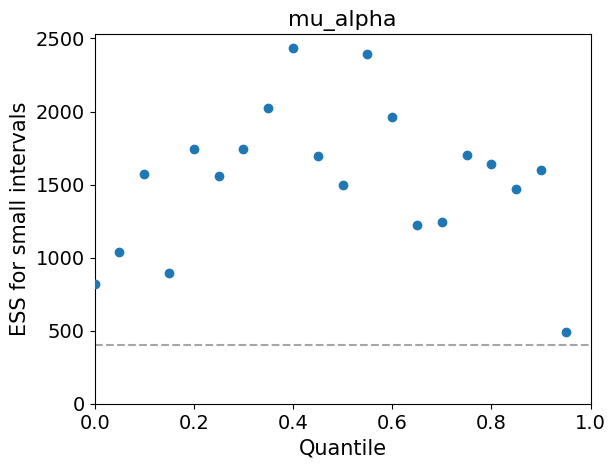

In [53]:
az.plot_ess(h_data,var_names=["mu_alpha"],coords = {"stock": "CAT"},)

האם להמשיך לדגום יעזור לנו??

400 זה מספר הקסם!!
הסיבה שבוחרים אלפא = 0.05 ו400 היא קשורה

השונות שאנו רוצים שורש מספר הדגימות אם יש לנו 400 דגימות שורש = 20 ומכאן אלפא = 1/20

array([[<Axes: title={'center': 'intercept_mu_alpha'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'intercept_mu_beta'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'slope_mu_alpha'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'slope_mu_beta'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'mu_alpha'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'mu_beta'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'alpha\nGOOG'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'alpha\nMETA'}, xlabel='Total number of draws', ylabel='ESS'>],
       [<Axes: title={'center': 'alpha\nCAT'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'alpha\nKO'}, xlabel='Total number of draws', ylabel='ESS'>,
        <Axes: title={'center': 'alpha\n

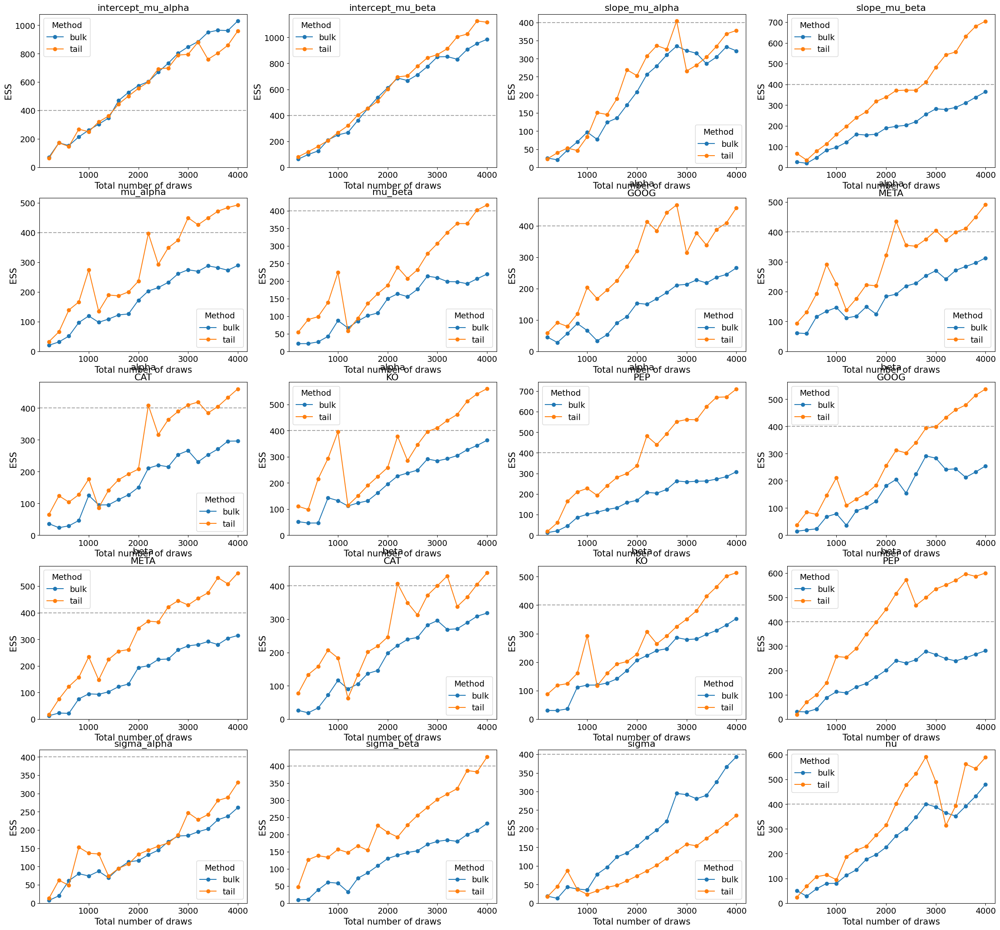

In [54]:
az.plot_ess(h_data,kind='evolution')

/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/pymc/data.py:265: FutureWarning: MutableData is deprecated. All Data variables are now mutable. Use Data instead.
  warnings.warn(


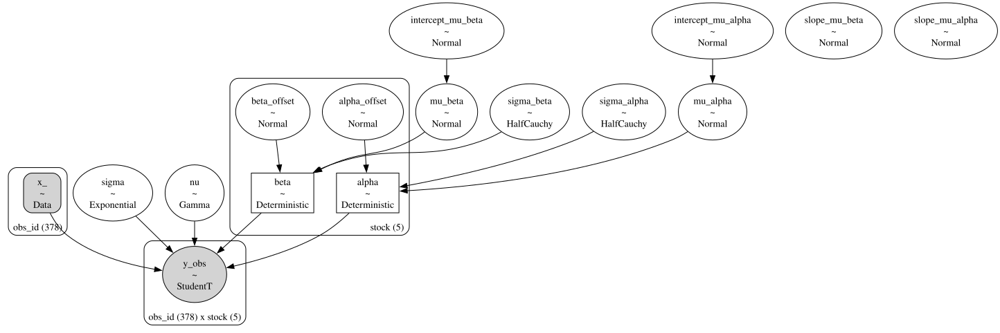

In [55]:
with pm.Model(coords=coords) as h_model:

    # ---------------------------
    # Input Data
    # ---------------------------

    x_ = pm.MutableData("x_", np.arange(T), dims="obs_id")

    # ---------------------------
    # Hyperpriors for Group-Level Means and Scales
    # ---------------------------

    intercept_mu_alpha = pm.Normal("intercept_mu_alpha", 0, sigma=1)
    intercept_mu_beta  = pm.Normal("intercept_mu_beta", 0, sigma=1)

    slope_mu_alpha = pm.Normal("slope_mu_alpha", 0, sigma=1)
    slope_mu_beta  = pm.Normal("slope_mu_beta", 0, sigma=1)

    mu_alpha  = pm.Normal("mu_alpha", mu=intercept_mu_alpha, sigma=1)
    sigma_alpha = pm.HalfCauchy("sigma_alpha", beta=0.1)

    mu_beta  = pm.Normal("mu_beta", mu=intercept_mu_beta, sigma=1)
    sigma_beta = pm.HalfCauchy("sigma_beta", beta=0.1)

    # ---------------------------
    # Non-Centered Stock-Level Parameters
    # ---------------------------

    alpha_offset = pm.Normal("alpha_offset", mu=0, sigma=1, dims="stock")
    beta_offset  = pm.Normal("beta_offset", mu=0, sigma=1, dims="stock")

    alpha = pm.Deterministic("alpha", mu_alpha + sigma_alpha * alpha_offset, dims="stock")
    beta  = pm.Deterministic("beta", mu_beta + sigma_beta * beta_offset, dims="stock")

    # ---------------------------
    # Observation Noise and Likelihood
    # ---------------------------

    sigma = pm.Exponential("sigma", lam=5)
    nu    = pm.Gamma("nu", alpha=2, beta=0.1)

    # Linear model
    mu = alpha[None, :] + beta[None, :] * x_[:, None]

    y_obs = pm.StudentT(
        "y_obs",
        nu=nu,
        mu=mu,
        sigma=sigma,
        observed=y_data,
        dims=("obs_id", "stock")
    )

graph = pm.model_to_graphviz(h_model)
display(graph)

In [56]:
with h_model:
    h_data = pm.sample(
        1000, tune=1000, target_accept=0.8, return_inferencedata=True
    )

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept_mu_alpha, intercept_mu_beta, slope_mu_alpha, slope_mu_beta, mu_alpha, sigma_alpha, mu_beta, sigma_beta, alpha_offset, beta_offset, sigma, nu]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.
There were 6 divergences after tuning. Increase `target_accept` or reparameterize.


/Users/menashelorenzi/Studies/BSc/Year3/2-AppliedStatistics/.venv/lib/python3.13/site-packages/arviz/plots/backends/matplotlib/pairplot.py:223: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of resulting pair plots with these variables, generating only a 8x8 grid
  warnings.warn(


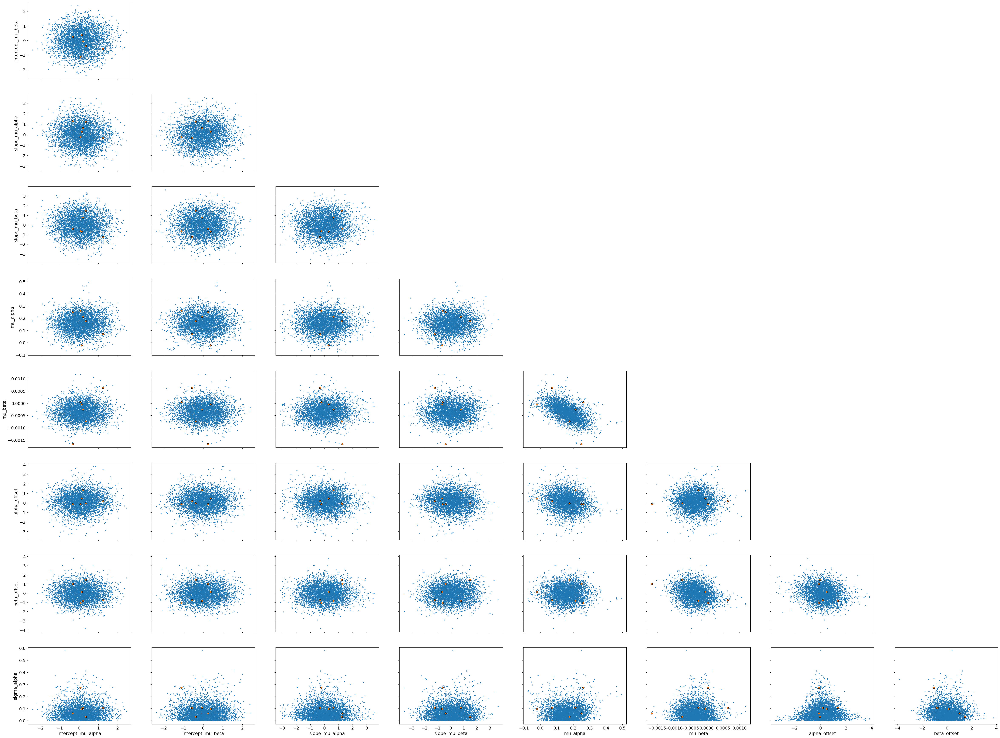

In [57]:
az.plot_pair(h_data,coords = {"stock": "CAT"}, kind='scatter', divergences=True);